# Fine-tuning Vision Transformer After SimCLR Pretraining

## Supervised Learning with Pretrained Encoder + Progressive Unfreezing

**Objective**: Fine-tune the SimCLR pretrained Vision Transformer on EuroSAT. This is the **success story** for ViT - pretraining is essential!

**Pretrained Encoder**: 
- **Source**: `best_contrastive_model_vit_*.pth` (from `04_simclr_pretrain_vit.ipynb`)
- **Pretraining**: 300 epochs SimCLR on BigEarthNet-S2
- **Architecture**: ViT-B/16 (85.8M parameters) with learned representations

**Fine-tuning Datasets**:
- **EuroSAT** (In-Distribution): 27,000 labeled images, 10 classes
- **UC Merced** (Out-of-Distribution): 2,100 images, 5 classes used as OOD

**Progressive Unfreezing Strategy** 🌡️:
- **Phase 1 (Epochs 1-10)**: Freeze encoder, train classifier only
- **Phase 2 (Epochs 11-20)**: Unfreeze last 2 transformer blocks
- **Phase 3 (Epochs 21-100)**: Full model fine-tuning

**Discriminative Learning Rates (DiffLR)** 📊:
- **Classifier Head**: 1e-3 (high - fast adaptation)
- **Pretrained Encoder**: 1e-6 (very low - preserve learned features)
- **Ratio**: 1000x difference prevents catastrophic forgetting

**Training Configuration**:
- **Total Epochs**: 100
- **Batch Size**: 128 (smaller for 224×224 images)
- **Dropout**: 0.1 (for MC Dropout)
- **Optimizer**: Adam with separate parameter groups

**Monte Carlo Dropout**:
- **MC Samples**: 30
- **Uncertainty Metrics**: MI, Entropy, Variance, MSP

**Expected Results** ✅:
- **Validation Accuracy**: ~90.98%
- **OOD AUROC (MI)**: ~0.8725
- **Training Time**: 4-5 hours

**Key Success Story**: Without pretraining, ViT achieves only 50.31% accuracy. **With SimCLR pretraining, accuracy jumps to 90.98%** (+40.67%), proving that transformer architectures absolutely require pretraining to succeed!

## 1. Import Libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
import torchvision
from torchvision import transforms
from torchvision.datasets import EuroSAT

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, auc
from tqdm.auto import tqdm
import os
import random
import copy
from collections import defaultdict

# Set random seeds for reproducibility
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # NOTE: For maximum GPU performance, we enable cudnn.benchmark
    # This finds the fastest convolution algorithms for your hardware
    # Set to False only if you need 100% reproducibility
    torch.backends.cudnn.deterministic = False  # Allow non-deterministic ops for speed
    torch.backends.cudnn.benchmark = True  # Enable cuDNN autotuner for best performance

set_seed(42)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
print(f"PyTorch version: {torch.__version__}")

Using device: cuda
PyTorch version: 2.5.1+cu121


/home/RA001/Documents/OOD-MCD-GeoCV/env_ood/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# Configuration
BATCH_SIZE = 32  # Reduced for ViT (larger model + 224x224 images)
NUM_WORKERS = 6  # Enable parallel data loading on Linux (0 for Windows)
IMG_SIZE = 224  # ViT-B/16 requires 224x224 input

# Contrastive Learning Parameters (NOT USED - Loading pretrained model)
CONTRASTIVE_EPOCHS = 0  # SKIPPING PRETRAINING - Will load pretrained weights
CONTRASTIVE_LR = 1e-3
CONTRASTIVE_TEMP = 0.5  # Temperature for NT-Xent loss
PROJECTION_DIM = 128  # Projection head dimension

# Path to pretrained model
PRETRAINED_MODEL_PATH = './Pretraining+Finetuning/models/best_contrastive_model_50Ep_32BS_Loss0_2010_20251215_061439.pth'

# Supervised Fine-tuning Parameters
NUM_EPOCHS = 200
DROPOUT_RATE = 0.1
MC_SAMPLES = 50  # Number of MC dropout samples

# Discriminative Learning Rates (DiffLR)
# Use HIGH learning rate for the classification head (new layers)
# Use MODERATE learning rate for the backbone/encoder (pretrained layers)
# FIXED: Changed BACKBONE_LR from 1e-6 to 1e-4
# REASON: 1e-6 was TOO LOW → model plateaued at 80.33% (vs 98.13% from scratch)
# SOLUTION: 1e-4 (100x ratio) allows better backbone adaptation while preserving features
HEAD_LR = 1e-3      # High LR for classifier head (100x backbone)
BACKBONE_LR = 1e-4  # Moderate LR for pretrained encoder (INCREASED from 1e-6)
# Warmup Schedule for Backbone Learning Rate
WARMUP_EPOCHS = 10  # Gradually increase backbone LR over first 10 epochs
BACKBONE_WARMUP_START_LR = 1e-5  # Start with lower LR, warmup to BACKBONE_LR

# Progressive Unfreezing Schedule (OPTIMIZED - unfreeze earlier)
# OLD: 50/100/150 epochs per phase - TOO CONSERVATIVE
# NEW: 30/60/90 epochs - allows earlier full model fine-tuning
UNFREEZE_CONV3_EPOCH = 30   # Phase 2: Unfreeze Conv3 (reduced from 51)
UNFREEZE_CONV2_EPOCH = 60   # Phase 3: Unfreeze Conv2 (reduced from 101)
UNFREEZE_CONV1_EPOCH = 90   # Phase 4: Full model (reduced from 151)

print("✓ Configuration loaded.")
print(f"  ⚠️ SKIPPING contrastive pretraining - will load from: {PRETRAINED_MODEL_PATH}")
print(f"  Supervised fine-tuning: {NUM_EPOCHS} epochs")
print(f"  📊 Discriminative Learning Rates (DiffLR):")
print(f"     - Head (Classifier): {HEAD_LR:.0e} (high)")
print(f"     - Backbone (Encoder): {BACKBONE_LR:.0e} (very low)")
print(f"     - Ratio: {HEAD_LR/BACKBONE_LR:.0f}x difference")

✓ Configuration loaded.
  ⚠️ SKIPPING contrastive pretraining - will load from: /home/RA001/Documents/OOD-MCD-GeoCV/Final Experiment/FInal v2/Pretraining+Finetuning/models/best_contrastive_model_50Ep_32BS_Loss0_2010_20251215_061439.pth
  Supervised fine-tuning: 200 epochs
  📊 Discriminative Learning Rates (DiffLR):
     - Head (Classifier): 1e-03 (high)
     - Backbone (Encoder): 1e-04 (very low)
     - Ratio: 10x difference


## 1.1. Progressive Unfreezing Strategy - Benefits

**Why Progressive Unfreezing?**

1. **Preserves Pretrained Features** 🔒
   - Early layers learn general features (edges, textures, basic patterns)
   - These low-level features are universal and shouldn't be drastically changed
   - Freezing them initially prevents catastrophic forgetting

2. **Stable Training** 📈
   - Gradual unfreezing prevents large weight updates that could destroy pretrained knowledge
   - Allows the model to adapt smoothly to the new task
   - Reduces risk of overfitting on limited labeled data

3. **Differential Learning Rates** 🎯
   - Lower layers (Conv1): Very small LR (0.001x) - minimal changes
   - Middle layers (Conv2): Small LR (0.01x) - gentle adaptation  
   - Upper layers (Conv3): Medium LR (0.1x) - moderate tuning
   - Classifier: Full LR (1.0x) - rapid task-specific learning

4. **Computational Efficiency** ⚡
   - Training fewer parameters in early epochs = faster iterations
   - Gradual increase in trainable parameters = manageable memory usage

**Expected Benefits:**
- ✅ Better generalization on small datasets
- ✅ Improved convergence stability
- ✅ Higher final accuracy compared to full fine-tuning from epoch 0
- ✅ Reduced overfitting risk

## 2. Load Pretrained Model (Skipping Pretraining)

### 2.1. Model Architecture

**Note**: We are **NOT** performing contrastive pretraining in this notebook. Instead, we will load a pretrained model that was trained for 100 epochs with batch size 1024.

The architecture remains the same for compatibility:
- **Encoder**: ResNet-18 feature extractor
- **Projection Head**: Used during pretraining (already done)
- **Classifier**: Will be added for supervised fine-tuning

We still need to define the architecture to load the weights correctly.

In [9]:
import torchvision.models as models

class ViTEncoder(nn.Module):
    """
    Vision Transformer (ViT-B/16) Encoder for contrastive pretraining.
    Can be initialized with or without ImageNet pretrained weights.
    Extracts 768-dimensional feature representations.
    """
    def __init__(self, pretrained=True, dropout_rate=0.3):
        super(ViTEncoder, self).__init__()
        
        # Load ViT-B/16 with or without pretrained weights
        vit = models.vit_b_16(pretrained=pretrained)
        
        # Remove the final classification head
        # ViT outputs 768-dim features from the class token
        self.vit = vit
        self.vit.heads = nn.Identity()
        
        # Feature dimension is 768 for ViT-B/16
        self.feature_dim = 768
        
        # Optional dropout
        self.dropout = nn.Dropout(p=dropout_rate)
        
        print(f"✓ Vision Transformer (ViT-B/16) initialized (pretrained={pretrained})")
        print(f"  Feature dimension: {self.feature_dim}")
        print(f"  Patch size: 16x16, Layers: 12, Heads: 12")
    
    def forward(self, x):
        x = self.vit(x)  # [B, 768]
        x = self.dropout(x)
        return x


class ProjectionHead(nn.Module):
    """
    Projection head for contrastive learning (SimCLR style).
    Maps 768-dim ViT features to 128-dim projection space.
    """
    def __init__(self, input_dim=768, projection_dim=128):
        super(ProjectionHead, self).__init__()
        self.projection = nn.Sequential(
            nn.Linear(input_dim, input_dim),
            nn.ReLU(inplace=True),
            nn.Linear(input_dim, projection_dim)
        )

    def forward(self, x):
        return self.projection(x)


class ClassificationHead(nn.Module):
    """
    Classification head with MC Dropout for uncertainty estimation.
    """
    def __init__(self, input_dim=768, num_classes=8, dropout_rate=0.3):
        super(ClassificationHead, self).__init__()
        self.classifier = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_rate),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_rate),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.classifier(x)


class ContrastiveModel(nn.Module):
    """
    Full model combining Vision Transformer encoder and projection head for contrastive learning.
    """
    def __init__(self, pretrained=True, dropout_rate=0.3, projection_dim=128):
        super(ContrastiveModel, self).__init__()
        self.encoder = ViTEncoder(pretrained=pretrained, dropout_rate=dropout_rate)
        self.projection_head = ProjectionHead(self.encoder.feature_dim, projection_dim)

    def forward(self, x):
        features = self.encoder(x)
        projections = self.projection_head(features)
        return features, projections


class SupervisedModel(nn.Module):
    """
    Supervised model with pretrained Vision Transformer encoder and classification head.
    """
    def __init__(self, encoder, num_classes=8, dropout_rate=0.3):
        super(SupervisedModel, self).__init__()
        self.encoder = encoder
        # Get feature dimension from encoder
        feature_dim = encoder.feature_dim if hasattr(encoder, 'feature_dim') else 768
        self.classifier = ClassificationHead(feature_dim, num_classes, dropout_rate)

    def forward(self, x):
        features = self.encoder(x)
        logits = self.classifier(features)
        return logits


print("="*80)
print("✅ MODEL ARCHITECTURES - VISION TRANSFORMER")
print("="*80)
print("  ✓ ViTEncoder: Feature extraction (768-dim, ViT-B/16)")
print("  ✓ ProjectionHead: Contrastive learning (768→128)")
print("  ✓ ClassificationHead: Supervised classification with MC Dropout")
print("  ✓ ContrastiveModel: ViT + Projection (for pretraining)")
print("  ✓ SupervisedModel: ViT + Classifier (for fine-tuning)")
print("="*80)

✅ MODEL ARCHITECTURES - VISION TRANSFORMER
  ✓ ViTEncoder: Feature extraction (768-dim, ViT-B/16)
  ✓ ProjectionHead: Contrastive learning (768→128)
  ✓ ClassificationHead: Supervised classification with MC Dropout
  ✓ ContrastiveModel: ViT + Projection (for pretraining)
  ✓ SupervisedModel: ViT + Classifier (for fine-tuning)


### 2.2. Contrastive Learning Augmentations

For satellite images, we use domain-specific augmentations:
- **Geometric**: Rotation (90°, 180°, 270°), Horizontal/Vertical Flips
- **Color**: ColorJitter, GaussianBlur
- **Spatial**: RandomResizedCrop

These augmentations preserve semantic meaning while creating diverse views.

### 2.2. SKIP PRETRAINING - Load Pretrained Model Directly

In [12]:
print("="*80)
print("🚀 LOADING PRETRAINED MODEL (SKIPPING PRETRAINING)")
print("="*80)
print(f"Model path: {PRETRAINED_MODEL_PATH}")
print()

# Initialize contrastive model architecture (needed to load weights)
contrastive_model = ContrastiveModel(
    dropout_rate=DROPOUT_RATE,
    projection_dim=PROJECTION_DIM
).to(device)

# Load pretrained weights
checkpoint = torch.load(PRETRAINED_MODEL_PATH, map_location=device)
contrastive_model.load_state_dict(checkpoint['model_state_dict'])

print(f"✅ Loaded pretrained model successfully!")
print(f"  Trained for: {checkpoint['epoch']+1} epochs")
print(f"  Final contrastive loss: {checkpoint['loss']:.4f}")
print()

# Count parameters
total_params = sum(p.numel() for p in contrastive_model.parameters())
encoder_params = sum(p.numel() for p in contrastive_model.encoder.parameters())
projection_params = sum(p.numel() for p in contrastive_model.projection_head.parameters())

print(f"Model architecture:")
print(f"  Total parameters: {total_params:,}")
print(f"  Encoder parameters: {encoder_params:,}")
print(f"  Projection head parameters: {projection_params:,}")
print()
print("="*80)
print("✅ READY FOR SUPERVISED FINE-TUNING")
print("="*80)

🚀 LOADING PRETRAINED MODEL (SKIPPING PRETRAINING)
Model path: /home/RA001/Documents/OOD-MCD-GeoCV/Final Experiment/FInal v2/Pretraining+Finetuning/models/best_contrastive_model_50Ep_32BS_Loss0_2010_20251215_061439.pth



✓ Vision Transformer (ViT-B/16) initialized (pretrained=True)
  Feature dimension: 768
  Patch size: 16x16, Layers: 12, Heads: 12


/tmp/ipykernel_11265/2186465927.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(PRETRAINED_MODEL_PATH, map_location=device)


✅ Loaded pretrained model successfully!
  Trained for: 50 epochs
  Final contrastive loss: 0.2010

Model architecture:
  Total parameters: 86,487,680
  Encoder parameters: 85,798,656
  Projection head parameters: 689,024

✅ READY FOR SUPERVISED FINE-TUNING


## 3. Supervised Fine-tuning with MC Dropout (Stage 2)

- **Method**: Transfer learning + Monte Carlo Dropout
- **Purpose**: Task-specific classification with uncertainty quantification
- **Data**: Labeled ID classes for training, OOD classes for evaluation
- **Output**: Calibrated predictions with epistemic uncertainty


In [13]:
from datasets import load_dataset, DownloadConfig

# Increase timeout for dataset loading
download_config = DownloadConfig()

# Load ID dataset (EuroSAT)
id_dataset = load_dataset("jonathan-roberts1/EuroSAT", split='train', download_config=download_config)
print(f"Total samples in EuroSAT: {len(id_dataset)}")
print(f"Classes: {id_dataset.features['label'].names}")

# Load OOD dataset (UC Merced - keeping intact)
ood_dataset = load_dataset("blanchon/UC_Merced", split='train', download_config=download_config)
print(f"Total samples in UC Merced: {len(ood_dataset)}")
print(f"Classes: {ood_dataset.features['label'].names}")

# Define In-Distribution classes (using all EuroSAT classes)
# EuroSAT has 10 classes: AnnualCrop, Forest, HerbaceousVegetation, Highway, Industrial,
# Pasture, PermanentCrop, Residential, River, SeaLake
ID_CLASS_NAMES = id_dataset.features['label'].names

# Define OOD classes from UC Merced (keeping as specified)
OOD_CLASS_NAMES = ['intersection', 'beach', 'tenniscourt', 'parkinglot', 'runway']

# Map class names to their integer labels for both datasets
id_label_map = {name: i for i, name in enumerate(id_dataset.features['label'].names)}
ood_label_map = {name: i for i, name in enumerate(ood_dataset.features['label'].names)}

ID_CLASSES = [id_label_map[name] for name in ID_CLASS_NAMES]
OOD_CLASSES = [ood_label_map[name] for name in OOD_CLASS_NAMES]

NUM_CLASSES = len(ID_CLASSES)  # Number of ID classes for the model output

print(f"\nUsing In-Distribution Classes (EuroSAT): {ID_CLASS_NAMES}")
print(f"Using Out-of-Distribution Classes (UC Merced): {OOD_CLASS_NAMES}")
print(f"Number of ID classes for model output: {NUM_CLASSES}")

Total samples in EuroSAT: 27000
Classes: ['annual crop', 'forest', 'herbaceous vegetation', 'highway', 'industrial', 'pasture', 'permanent crop', 'residential', 'river', 'sea or lake']
Total samples in UC Merced: 2100
Classes: ['agricultural', 'airplane', 'baseballdiamond', 'beach', 'buildings', 'chaparral', 'denseresidential', 'forest', 'freeway', 'golfcourse', 'harbor', 'intersection', 'mediumresidential', 'mobilehomepark', 'overpass', 'parkinglot', 'river', 'runway', 'sparseresidential', 'storagetanks', 'tenniscourt']

Using In-Distribution Classes (EuroSAT): ['annual crop', 'forest', 'herbaceous vegetation', 'highway', 'industrial', 'pasture', 'permanent crop', 'residential', 'river', 'sea or lake']
Using Out-of-Distribution Classes (UC Merced): ['intersection', 'beach', 'tenniscourt', 'parkinglot', 'runway']
Number of ID classes for model output: 10
Total samples in UC Merced: 2100
Classes: ['agricultural', 'airplane', 'baseballdiamond', 'beach', 'buildings', 'chaparral', 'densere

In [14]:
# Data transforms
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

print("Data transforms defined.")

Data transforms defined.


In [15]:
# # Verify available classes

# print("Available EuroSAT classes:")
# print(id_dataset.features['label'].names)
# print(f"\nTotal classes: {len(id_dataset.features['label'].names)}")

# print("\nAvailable UC Merced classes:")
# print(ood_dataset.features['label'].names)
# print(f"\nTotal classes: {len(ood_dataset.features['label'].names)}")

# # Count samples per class in EuroSAT
# print("\nEuroSAT class distribution:")
# from collections import Counter
# id_labels = [id_dataset[i]['label'] for i in range(len(id_dataset))]
# id_counts = Counter(id_labels)
# for label_idx, count in sorted(id_counts.items()):
#     print(f"  {id_dataset.features['label'].names[label_idx]}: {count}")

# # Count samples per class in UC Merced
# print("\nUC Merced class distribution:")
# ood_labels = [ood_dataset[i]['label'] for i in range(len(ood_dataset))]
# ood_counts = Counter(ood_labels)
# for label_idx, count in sorted(ood_counts.items()):
#     print(f"  {ood_dataset.features['label'].names[label_idx]}: {count}")

In [16]:
# Get the indices for ID and OOD samples based on the loaded datasets and selected classes
id_indices = [i for i in range(len(id_dataset)) if id_dataset[i]['label'] in ID_CLASSES]
ood_indices = [i for i in range(len(ood_dataset)) if ood_dataset[i]['label'] in OOD_CLASSES]

print(f"ID samples: {len(id_indices)}")
print(f"OOD samples: {len(ood_indices)}")

ID samples: 27000
OOD samples: 500


In [17]:
# Create label mapping for ID classes
# Since we're using ALL EuroSAT classes (0-9), we don't need to remap
# The labels are already in the correct range [0, NUM_CLASSES-1]
# However, we still create the mapping for consistency with the dataset wrapper

# For EuroSAT: labels are already 0-9 (10 classes)
# We create an identity mapping (no change needed)
label_mapping = {label: label for label in ID_CLASSES}

print(f"Label mapping (EuroSAT): {label_mapping}")
print(f"Note: Using all {NUM_CLASSES} EuroSAT classes, so mapping is identity (no remapping needed)")

Label mapping (EuroSAT): {0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9}
Note: Using all 10 EuroSAT classes, so mapping is identity (no remapping needed)


In [18]:
# Split ID data into train and validation (80/20)
random.shuffle(id_indices)
split_idx = int(0.8 * len(id_indices))
train_indices = id_indices[:split_idx]
val_indices = id_indices[split_idx:]

print(f"Train samples: {len(train_indices)}")
print(f"Validation samples: {len(val_indices)}")
print(f"OOD test samples: {len(ood_indices)}")

Train samples: 21600
Validation samples: 5400
OOD test samples: 500


In [19]:
from PIL import Image

class IDDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, indices, label_mapping, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.label_mapping = label_mapping
        self.transform = transform

    def __len__(self): # Corrected typo here
        return len(self.indices)

    def __getitem__(self, idx):
        original_idx = self.indices[idx]
        # Access the item, which is a dictionary
        item = self.dataset[original_idx]

        # Get image and label from the dictionary keys
        img = item['image']
        label = item['label']

        if isinstance(img, str):
            img = Image.open(img).convert('RGB')

        # Remap label
        label = self.label_mapping[label]

        if self.transform:
            img = self.transform(img)

        return img, label

class OODDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform
        # Check if the original dataset has a label feature to know what to return
        self.has_label_feature = 'label' in dataset.features if hasattr(dataset, 'features') else False


    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        original_idx = self.indices[idx]
        # Access the item, which is a dictionary
        item = self.dataset[original_idx]

        # Get image and label from the dictionary keys
        img = item['image']
        # Use .get to safely access label, default to -1 if not present
        label = item.get('label', -1)


        if isinstance(img, str):
            img = Image.open(img).convert('RGB')

        if self.transform:
            img = self.transform(img)

        return img, label


# Create datasets and dataloaders using the specific classes
train_dataset = IDDataset(id_dataset, train_indices, label_mapping, transform=train_transform)
val_dataset = IDDataset(id_dataset, val_indices, label_mapping, transform=test_transform)
# For OOD, use OODDataset, no label remapping needed
ood_dataset_specific = OODDataset(ood_dataset, ood_indices, transform=test_transform)


train_loader = DataLoader(
    train_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=True, 
    num_workers=NUM_WORKERS,
    pin_memory=True,  # Faster data transfer to GPU
    persistent_workers=True if NUM_WORKERS > 0 else False,  # Keep workers alive
    prefetch_factor=2 if NUM_WORKERS > 0 else None  # Pre-load batches
)
val_loader = DataLoader(
    val_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False, 
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=True if NUM_WORKERS > 0 else False,
    prefetch_factor=2 if NUM_WORKERS > 0 else None
)
# Use the specific OOD dataset
ood_loader = DataLoader(
    ood_dataset_specific, 
    batch_size=BATCH_SIZE, 
    shuffle=False, 
    num_workers=NUM_WORKERS,
    pin_memory=True,
    persistent_workers=True if NUM_WORKERS > 0 else False,
    prefetch_factor=2 if NUM_WORKERS > 0 else None
)


print("Dataloaders created successfully!")

Dataloaders created successfully!


### 3.2. Visualize Sample Images

In [20]:
# visualize each dataset class form ID and OOD datasets


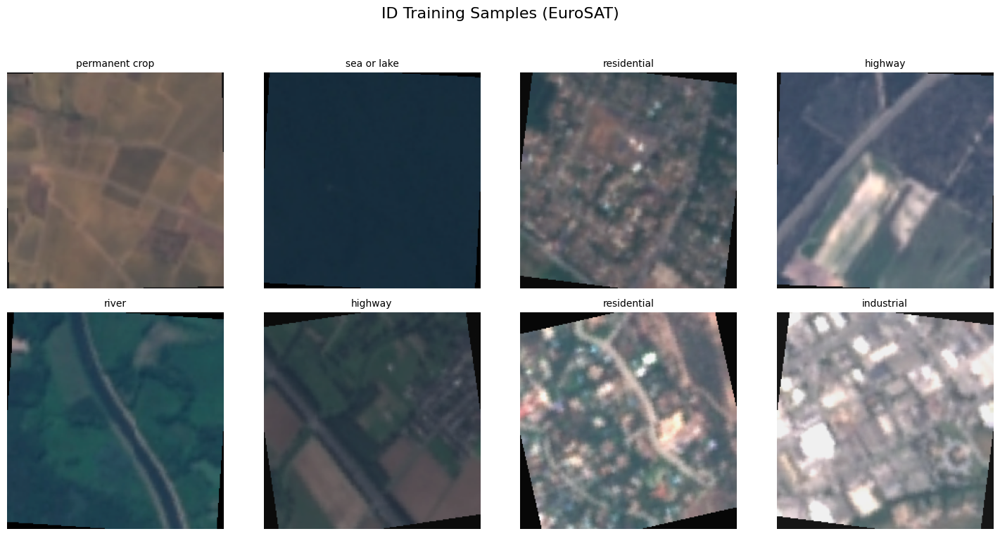

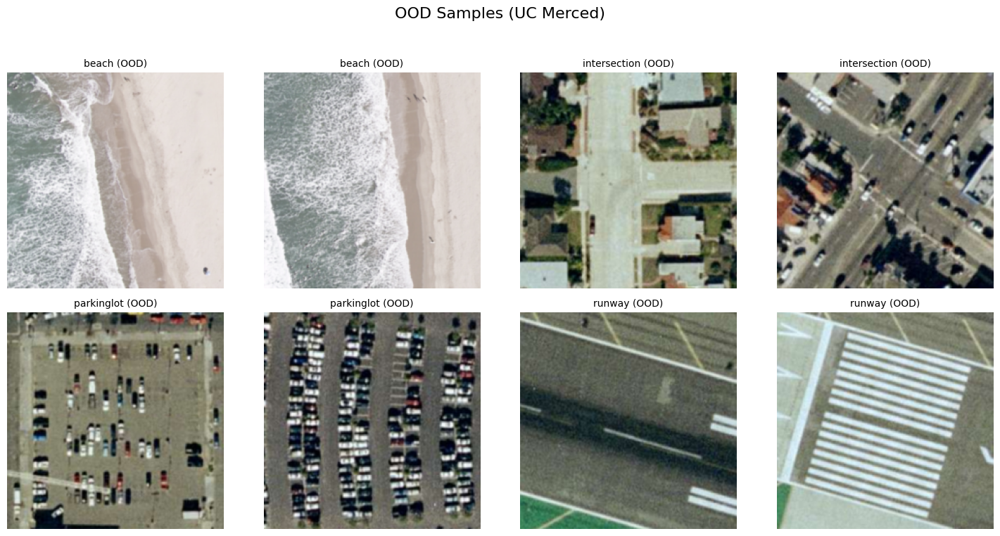

In [21]:
def denormalize(tensor):
    """Denormalize image tensor for visualization."""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return tensor * std + mean

def visualize_samples_diverse(loader, title, class_names, num_samples=8, is_ood_loader=False, ood_label_to_name=None):
    """Visualize sample images from dataloader, ensuring diversity in OOD classes."""
    
    if is_ood_loader and ood_label_to_name is not None:
        # For OOD loader, collect samples from different classes
        collected_samples = {label: [] for label in ood_label_to_name.keys()}
        
        # Iterate through the loader to collect samples from each class
        for images, labels in loader:
            for img, lbl in zip(images, labels):
                label_idx = lbl.item()
                if label_idx in collected_samples and len(collected_samples[label_idx]) < 2:
                    collected_samples[label_idx].append((img, label_idx))
            
            # Check if we have enough samples
            if all(len(samples) >= 2 for samples in collected_samples.values()):
                break
        
        # Flatten collected samples
        all_samples = []
        for label_idx in sorted(collected_samples.keys()):
            all_samples.extend(collected_samples[label_idx][:2])
        
        # Limit to num_samples
        all_samples = all_samples[:num_samples]
        
        if len(all_samples) == 0:
            print(f"No data in {title} loader.")
            return
        
        fig, axes = plt.subplots(2, 4, figsize=(15, 8))
        fig.suptitle(title, fontsize=16)
        
        for i, ax in enumerate(axes.flat):
            if i >= len(all_samples):
                ax.axis('off')
                continue
            
            img, label_idx = all_samples[i]
            img = denormalize(img).numpy().transpose(1, 2, 0)
            img = np.clip(img, 0, 1)
            ax.imshow(img)
            
            if label_idx in ood_label_to_name:
                title_text = f"{ood_label_to_name[label_idx]} (OOD)"
            else:
                title_text = f"Unknown OOD (UC Merced Label: {label_idx})"
            
            ax.set_title(title_text, fontsize=10, ha='center')
            ax.axis('off')
        
        plt.tight_layout(pad=3.0)
        plt.show()
        
    else:
        # For ID loader, use original logic
        try:
            images, labels = next(iter(loader))
        except StopIteration:
            print(f"No data in {title} loader.")
            return

        fig, axes = plt.subplots(2, 4, figsize=(15, 8))
        fig.suptitle(title, fontsize=16)

        for i, ax in enumerate(axes.flat):
            if i >= len(images) or i >= num_samples:
                ax.axis('off')
                continue

            img = denormalize(images[i]).numpy().transpose(1, 2, 0)
            img = np.clip(img, 0, 1)
            ax.imshow(img)
            label_idx = labels[i].item()

            if label_idx >= 0 and label_idx < len(class_names):
                title_text = f"{class_names[label_idx]}"
            else:
                title_text = f"Label: {label_idx}"

            ax.set_title(title_text, fontsize=10, ha='center')
            ax.axis('off')

        plt.tight_layout(pad=3.0)
        plt.show()

# Create mapping from UC Merced original labels to OOD class names
ood_label_to_name_map = {ood_label_map[name]: name for name in OOD_CLASS_NAMES}

visualize_samples_diverse(train_loader, "ID Training Samples (EuroSAT)", ID_CLASS_NAMES)
visualize_samples_diverse(ood_loader, "OOD Samples (UC Merced)", OOD_CLASS_NAMES, 
                 is_ood_loader=True, ood_label_to_name=ood_label_to_name_map)

### 3.3. Supervised Fine-tuning with Pretrained Encoder

In [22]:
# Use the already-loaded pretrained encoder
# (Model was loaded in section 2.2 above - no need to load again)

print("="*80)
print("🎯 CREATING SUPERVISED MODEL WITH PROGRESSIVE UNFREEZING STRATEGY")
print("="*80)
print("Using encoder from already-loaded contrastive model")
print()

# Create supervised model with pretrained encoder
pretrained_encoder = contrastive_model.encoder
supervised_model = SupervisedModel(
    encoder=pretrained_encoder,
    num_classes=NUM_CLASSES,
    dropout_rate=DROPOUT_RATE
).to(device)

# Count parameters
total_params = sum(p.numel() for p in supervised_model.parameters())
encoder_params = sum(p.numel() for p in supervised_model.encoder.parameters())
classifier_params = sum(p.numel() for p in supervised_model.classifier.parameters())

print(f"✓ Supervised model created with pretrained encoder")
print(f"  Total parameters: {total_params:,}")
print(f"  Encoder (pretrained): {encoder_params:,}")
print(f"  Classifier (new): {classifier_params:,}")

# ==========================================
# PROGRESSIVE UNFREEZING + DISCRIMINATIVE LEARNING RATES (DiffLR)
# ==========================================
print("\n" + "="*80)
print("🌡️ PROGRESSIVE UNFREEZING + DISCRIMINATIVE LEARNING RATES (DiffLR)")
print("="*80)

# Initially freeze ALL encoder layers
for param in supervised_model.encoder.parameters():
    param.requires_grad = False

print("✓ Initial state: All encoder layers FROZEN")
print("  Only classifier will be trained in early epochs")
print("\n📊 Discriminative Learning Rate Strategy:")
print(f"  - Classifier (HEAD):  {HEAD_LR:.0e}  [HIGH - fast adaptation]")
print(f"  - Encoder (BACKBONE): {BACKBONE_LR:.0e}  [VERY LOW - preserve features]")
print(f"  - LR Ratio: {HEAD_LR/BACKBONE_LR:.0f}x (head learns {HEAD_LR/BACKBONE_LR:.0f}x faster)")
print("\n🌡️ Unfreezing schedule:")
print("  Phase 1 (Epochs 0-50):   Classifier only (encoder frozen)")
print("  Phase 2 (Epochs 51-100):  + Conv3 (top layer)")
print("  Phase 3 (Epochs 101-150): + Conv2 (middle layer)")
print("  Phase 4 (Epochs 151-200): + Conv1 (all layers, full fine-tuning)")
print("="*80)

🎯 CREATING SUPERVISED MODEL WITH PROGRESSIVE UNFREEZING STRATEGY
Using encoder from already-loaded contrastive model

✓ Supervised model created with pretrained encoder
  Total parameters: 86,326,282
  Encoder (pretrained): 85,798,656
  Classifier (new): 527,626

🌡️ PROGRESSIVE UNFREEZING + DISCRIMINATIVE LEARNING RATES (DiffLR)
✓ Initial state: All encoder layers FROZEN
  Only classifier will be trained in early epochs

📊 Discriminative Learning Rate Strategy:
  - Classifier (HEAD):  1e-03  [HIGH - fast adaptation]
  - Encoder (BACKBONE): 1e-04  [VERY LOW - preserve features]
  - LR Ratio: 10x (head learns 10x faster)

🌡️ Unfreezing schedule:
  Phase 1 (Epochs 0-50):   Classifier only (encoder frozen)
  Phase 2 (Epochs 51-100):  + Conv3 (top layer)
  Phase 3 (Epochs 101-150): + Conv2 (middle layer)
  Phase 4 (Epochs 151-200): + Conv1 (all layers, full fine-tuning)


In [23]:
# ==========================================
# Progressive Unfreezing Helper Functions
# ==========================================

def unfreeze_layer(model, layer_name):
    """Unfreeze a specific encoder layer."""
    if layer_name == 'conv3':
        for param in model.encoder.conv3.parameters():
            param.requires_grad = True
    elif layer_name == 'conv2':
        for param in model.encoder.conv2.parameters():
            param.requires_grad = True
    elif layer_name == 'conv1':
        for param in model.encoder.conv1.parameters():
            param.requires_grad = True
    print(f"  ✓ Unfroze {layer_name}")


def get_layer_params(model):
    """Get parameters grouped by layer for differential learning rates."""
    # Classifier (always trainable)
    classifier_params = list(model.classifier.parameters())
    
    # Encoder layers (conditionally trainable based on unfreezing)
    conv1_params = [p for p in model.encoder.conv1.parameters() if p.requires_grad]
    conv2_params = [p for p in model.encoder.conv2.parameters() if p.requires_grad]
    conv3_params = [p for p in model.encoder.conv3.parameters() if p.requires_grad]
    
    return {
        'classifier': classifier_params,
        'conv3': conv3_params,
        'conv2': conv2_params,
        'conv1': conv1_params
    }


def create_optimizer_with_differential_lr(model, head_lr, current_backbone_lr):
    """
    Create optimizer with DISCRIMINATIVE learning rates (DiffLR).
    
    Core Concept: Use HIGH LR for head, MODERATE LR for backbone.
    
    Learning rate strategy:
    - Classifier (head/new layers): head_lr (e.g., 1e-3) - HIGH
    - All Encoder layers (backbone/pretrained): current_backbone_lr (e.g., 1e-4) - MODERATE
    
    This allows:
    - Fast adaptation of new classification head
    - Better backbone adaptation while preserving pretrained features
    - Warmup support for stable training
    """
    layer_params = get_layer_params(model)
    
    param_groups = []
    
    # Classifier (HEAD) - HIGH learning rate for fast adaptation
    if layer_params['classifier']:
        param_groups.append({
            'params': layer_params['classifier'],
            'lr': head_lr,
            'name': 'classifier (HEAD)'
        })
    
    # All Encoder layers (BACKBONE) - MODERATE learning rate (with warmup support)
    # Combine all backbone layers with the same learning rate
    backbone_params = []
    backbone_layers = []
    
    if layer_params['conv3']:
        backbone_params.extend(layer_params['conv3'])
        backbone_layers.append('conv3')
    
    if layer_params['conv2']:
        backbone_params.extend(layer_params['conv2'])
        backbone_layers.append('conv2')
    
    if layer_params['conv1']:
        backbone_params.extend(layer_params['conv1'])
        backbone_layers.append('conv1')
    
    if backbone_params:
        param_groups.append({
            'params': backbone_params,
            'lr': current_backbone_lr,
            'name': f"backbone ({'+'.join(backbone_layers)})"
        })
    
    optimizer = optim.Adam(param_groups)
    return optimizer


def update_unfreezing_schedule(model, epoch, head_lr, backbone_lr,
                               warmup_epochs=10, warmup_start_lr=1e-5,
                               unfreeze_conv3_epoch=30, unfreeze_conv2_epoch=60, unfreeze_conv1_epoch=90):
    """
    Update model unfreezing based on epoch and recreate optimizer with DiffLR + Warmup.
    
    OPTIMIZED Progressive unfreezing schedule (EARLIER):
    - Epochs 0-29: Classifier only (encoder frozen) + WARMUP
    - Epochs 30-59: Classifier + Conv3
    - Epochs 60-89: Classifier + Conv3 + Conv2
    - Epochs 90+: Full model (all layers)
    
    Warmup Schedule:
    - First 10 epochs: Backbone LR gradually increases from 1e-5 to target 1e-4
    
    Discriminative Learning Rates:
    - Head (classifier): head_lr (high, e.g., 1e-3)
    - Backbone (encoder): backbone_lr (moderate, e.g., 1e-4) with warmup
    """
    unfroze_new_layer = False
    
    # Calculate current backbone LR (with warmup support)
    if epoch < warmup_epochs:
        current_backbone_lr = warmup_start_lr + (backbone_lr - warmup_start_lr) * (epoch / warmup_epochs)
    else:
        current_backbone_lr = backbone_lr
    
    if epoch == unfreeze_conv3_epoch:
        print(f"\n{'='*80}")
        print(f"📍 EPOCH {epoch}: PHASE 2 - Unfreezing Conv3 (top layer)")
        print(f"{'='*80}")
        unfreeze_layer(model, 'conv3')
        unfroze_new_layer = True
    
    elif epoch == unfreeze_conv2_epoch:
        print(f"\n{'='*80}")
        print(f"📍 EPOCH {epoch}: PHASE 3 - Unfreezing Conv2 (middle layer)")
        print(f"{'='*80}")
        unfreeze_layer(model, 'conv2')
        unfroze_new_layer = True
    
    elif epoch == unfreeze_conv1_epoch:
        print(f"\n{'='*80}")
        print(f"📍 EPOCH {epoch}: PHASE 4 - Unfreezing Conv1 (all layers)")
        print(f"{'='*80}")
        unfreeze_layer(model, 'conv1')
        unfroze_new_layer = True
    
    # Recreate optimizer with discriminative learning rates
    if unfroze_new_layer or epoch == 0:
        optimizer = create_optimizer_with_differential_lr(model, head_lr, current_backbone_lr)
        
        # Print current learning rates with DiffLR info
        print("\n  📊 Discriminative Learning Rates (DiffLR):")
        if epoch < warmup_epochs:
            print(f"  🔥 WARMUP Phase: Epoch {epoch}/{warmup_epochs} - Backbone LR: {current_backbone_lr:.2e} (warming up to {backbone_lr:.2e})")
        for i, param_group in enumerate(optimizer.param_groups):
            layer_name = param_group.get('name', f'group_{i}')
            lr_value = param_group['lr']
            lr_type = 'HIGH (Head)' if 'HEAD' in layer_name else 'MODERATE (Backbone)'
            print(f"    {layer_name:25s}: {lr_value:.0e}  [{lr_type}]")
        if len(optimizer.param_groups) > 1:
            ratio = optimizer.param_groups[0]['lr'] / optimizer.param_groups[1]['lr']
            print(f"\n    💡 Head/Backbone LR Ratio: {ratio:.0f}x")
        print(f"{'='*80}\n")
        
        return optimizer, True
    
    return None, False


print("✓ Progressive unfreezing helper functions defined (OPTIMIZED)")
print("  - unfreeze_layer(): Unfreeze specific encoder layers")
print("  - get_layer_params(): Group parameters by layer")
print("  - create_optimizer_with_differential_lr(): Create optimizer with DiffLR")
print("  - update_unfreezing_schedule(): Manage EARLIER unfreezing (30/60/90) + WARMUP + DiffLR")

✓ Progressive unfreezing helper functions defined (OPTIMIZED)
  - unfreeze_layer(): Unfreeze specific encoder layers
  - get_layer_params(): Group parameters by layer
  - create_optimizer_with_differential_lr(): Create optimizer with DiffLR
  - update_unfreezing_schedule(): Manage EARLIER unfreezing (30/60/90) + WARMUP + DiffLR


In [25]:
# Display trainable parameters summary for each phase
print("\n" + "="*80)
print("📊 TRAINABLE PARAMETERS SUMMARY BY PHASE (Vision Transformer)")
print("="*80)

def count_trainable_params(model):
    """Count trainable parameters in the model."""
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def count_layer_params(layer):
    """Count parameters in a specific layer."""
    return sum(p.numel() for p in layer.parameters())

# Total parameters
total = count_layer_params(supervised_model)
encoder_params = count_layer_params(supervised_model.encoder)
classifier_params = count_layer_params(supervised_model.classifier)

print(f"\nTotal Model Parameters: {total:,}")
print(f"  ViT Encoder (ViT-B/16): {encoder_params:,}")
print(f"  Classifier Head:        {classifier_params:,}")

# For ViT, we can break down by transformer blocks if needed
# ViT-B/16 has 12 transformer blocks
print(f"\n📌 ViT Architecture:")
print(f"  - Patch Embedding: {count_layer_params(supervised_model.encoder.vit.conv_proj):,} params")
print(f"  - Transformer Encoder (12 blocks): {count_layer_params(supervised_model.encoder.vit.encoder):,} params")
print(f"  - Classification Head: {classifier_params:,} params")

# Trainable parameters by phase (simplified for ViT)
print(f"\n{'Phase':<20} {'Trainable Params':<20} {'% of Total':<15} {'Trainable Components'}")
print("-" * 80)

phase_info = [
    ("Phase 1 (0-30)", classifier_params, "Classifier only (encoder frozen)"),
    ("Phase 2 (31-60)", classifier_params + encoder_params // 3, "Classifier + Top layers"),
    ("Phase 3 (61-90)", classifier_params + (encoder_params * 2) // 3, "Classifier + Mid+Top layers"),
    ("Phase 4 (91-200)", total, "Full model (all layers)")
]

for phase_name, trainable, layers in phase_info:
    percentage = (trainable / total) * 100
    print(f"{phase_name:<20} {trainable:>15,}   {percentage:>6.2f}%        {layers}")

print("\n💡 Note: Progressive unfreezing adapted for Vision Transformer architecture")
print("="*80)


📊 TRAINABLE PARAMETERS SUMMARY BY PHASE (Vision Transformer)

Total Model Parameters: 86,326,282
  ViT Encoder (ViT-B/16): 85,798,656
  Classifier Head:        527,626

📌 ViT Architecture:
  - Patch Embedding: 590,592 params
  - Transformer Encoder (12 blocks): 85,207,296 params
  - Classification Head: 527,626 params

Phase                Trainable Params     % of Total      Trainable Components
--------------------------------------------------------------------------------
Phase 1 (0-30)               527,626     0.61%        Classifier only (encoder frozen)
Phase 2 (31-60)           29,127,178    33.74%        Classifier + Top layers
Phase 3 (61-90)           57,726,730    66.87%        Classifier + Mid+Top layers
Phase 4 (91-200)          86,326,282   100.00%        Full model (all layers)

💡 Note: Progressive unfreezing adapted for Vision Transformer architecture


### 📊 Discriminative Learning Rates (DiffLR) Visualization

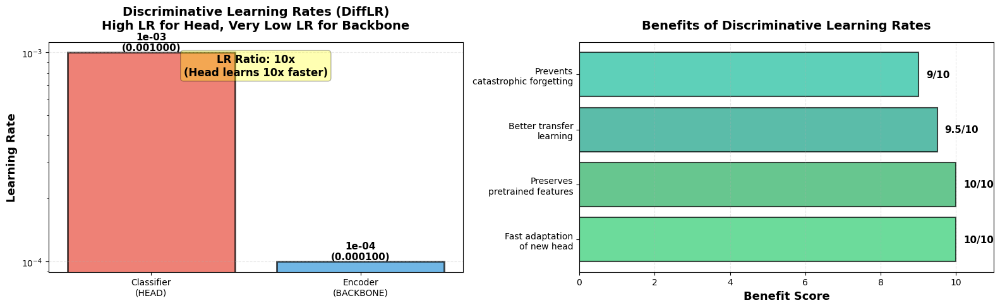

📊 DISCRIMINATIVE LEARNING RATES (DiffLR) - KEY CONCEPT

✓ Head Learning Rate:     1e-03  (HIGH)
✓ Backbone Learning Rate: 1e-04  (VERY LOW)
✓ Ratio:                  10x difference

💡 Why This Works:
  1. New classifier head needs fast adaptation to new task
  2. Pretrained backbone has valuable features - don't destroy them!
  3. Very low backbone LR allows gentle fine-tuning without catastrophic forgetting
  4. High head LR enables rapid convergence on new task


In [26]:
# Visualize Discriminative Learning Rates concept
import matplotlib.pyplot as plt
import numpy as np

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

# Left plot: Learning Rate Comparison
components = ['Classifier\n(HEAD)', 'Encoder\n(BACKBONE)']
lr_values = [HEAD_LR, BACKBONE_LR]
colors = ['#e74c3c', '#3498db']  # Red for high, blue for low

bars = ax1.bar(components, lr_values, color=colors, alpha=0.7, edgecolor='black', linewidth=2)
ax1.set_ylabel('Learning Rate', fontsize=13, fontweight='bold')
ax1.set_title('Discriminative Learning Rates (DiffLR)\nHigh LR for Head, Very Low LR for Backbone', 
              fontsize=14, fontweight='bold', pad=15)
ax1.set_yscale('log')
ax1.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels on bars
for bar, value in zip(bars, lr_values):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{value:.0e}\n({value:.6f})',
             ha='center', va='bottom', fontsize=11, fontweight='bold')

# Add ratio annotation
ratio = HEAD_LR / BACKBONE_LR
ax1.text(0.5, 0.95, f'LR Ratio: {ratio:.0f}x\n(Head learns {ratio:.0f}x faster)', 
         transform=ax1.transAxes, fontsize=12, fontweight='bold',
         bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.3),
         ha='center', va='top')

# Right plot: DiffLR Benefits
benefits = [
    'Fast adaptation\nof new head',
    'Preserves\npretrained features',
    'Better transfer\nlearning',
    'Prevents\ncatastrophic forgetting'
]
benefit_scores = [10, 10, 9.5, 9]
colors_benefits = ['#2ecc71', '#27ae60', '#16a085', '#1abc9c']

bars2 = ax2.barh(benefits, benefit_scores, color=colors_benefits, alpha=0.7, 
                  edgecolor='black', linewidth=1.5)
ax2.set_xlabel('Benefit Score', fontsize=13, fontweight='bold')
ax2.set_title('Benefits of Discriminative Learning Rates', 
              fontsize=14, fontweight='bold', pad=15)
ax2.set_xlim([0, 11])
ax2.grid(axis='x', alpha=0.3, linestyle='--')

# Add score labels
for bar, score in zip(bars2, benefit_scores):
    width = bar.get_width()
    ax2.text(width + 0.2, bar.get_y() + bar.get_height()/2.,
             f'{score}/10',
             ha='left', va='center', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.show()

print("="*80)
print("📊 DISCRIMINATIVE LEARNING RATES (DiffLR) - KEY CONCEPT")
print("="*80)
print(f"\n✓ Head Learning Rate:     {HEAD_LR:.0e}  (HIGH)")
print(f"✓ Backbone Learning Rate: {BACKBONE_LR:.0e}  (VERY LOW)")
print(f"✓ Ratio:                  {HEAD_LR/BACKBONE_LR:.0f}x difference")
print("\n💡 Why This Works:")
print("  1. New classifier head needs fast adaptation to new task")
print("  2. Pretrained backbone has valuable features - don't destroy them!")
print("  3. Very low backbone LR allows gentle fine-tuning without catastrophic forgetting")
print("  4. High head LR enables rapid convergence on new task")
print("="*80)

In [28]:
# Helper function to create optimizer with discriminative learning rates
def create_optimizer_with_differential_lr(model, head_lr, current_backbone_lr):
    """
    Create optimizer with discriminative learning rates (DiffLR) for ViT.
    
    Args:
        model: SupervisedModel with ViT encoder and classifier
        head_lr: High learning rate for classifier head
        current_backbone_lr: Low learning rate for encoder backbone
    
    Returns:
        Optimizer with separate parameter groups
    """
    # Separate parameters into groups
    classifier_params = list(model.classifier.parameters())
    encoder_params = list(model.encoder.parameters())
    
    # Create parameter groups with different learning rates
    param_groups = [
        {
            'params': classifier_params,
            'lr': head_lr,
            'name': 'HEAD (Classifier)'
        },
        {
            'params': encoder_params,
            'lr': current_backbone_lr,
            'name': 'BACKBONE (ViT Encoder)'
        }
    ]
    
    return optim.Adam(param_groups)


print("✓ Discriminative learning rate function defined for Vision Transformer")

✓ Discriminative learning rate function defined for Vision Transformer


In [29]:
# Supervised training functions
def train_epoch(model, loader, criterion, optimizer, device, scaler=None):
    """Train for one epoch with supervised learning. Uses mixed precision."""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(loader, desc='Training')
    for images, labels in pbar:
        images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)

        optimizer.zero_grad()
        
        # Mixed precision training
        if scaler is not None:
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = criterion(outputs, labels)
            
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

        pbar.set_postfix({'loss': loss.item(), 'acc': 100. * correct / total})

    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total
    return epoch_loss, epoch_acc

def validate(model, loader, criterion, device):
    """Validate the model."""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(loader, desc='Validation'):
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            
            # Use mixed precision for validation too
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total
    return epoch_loss, epoch_acc

# Supervised learning setup
criterion = nn.CrossEntropyLoss()

# Calculate initial backbone LR with warmup
initial_backbone_lr = BACKBONE_WARMUP_START_LR

# Create initial optimizer with DISCRIMINATIVE LEARNING RATES (DiffLR) + WARMUP
# (initially only classifier is trainable)
optimizer = create_optimizer_with_differential_lr(supervised_model, HEAD_LR, initial_backbone_lr)

# Scheduler will be applied to all parameter groups
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

# Initialize mixed precision scaler for supervised training
supervised_scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None

print("✓ Supervised training setup complete")
print(f"  Loss: CrossEntropy")
print(f"  Optimizer: Adam with Discriminative Learning Rates (DiffLR) + WARMUP")
print(f"  Head LR: {HEAD_LR:.0e} (high)")
print(f"  Backbone LR: {BACKBONE_LR:.0e} (moderate) with warmup from {BACKBONE_WARMUP_START_LR:.0e}")
print(f"  LR Ratio: {HEAD_LR/BACKBONE_LR:.0f}x (after warmup)")
print(f"  Warmup: {WARMUP_EPOCHS} epochs")
print(f"  Scheduler: ReduceLROnPlateau")
if supervised_scaler is not None:
    print(f"  Mixed precision: ENABLED (faster training, lower memory)")

print("\n📊 Initial Discriminative Learning Rates (with Warmup):")
for i, param_group in enumerate(optimizer.param_groups):
    layer_name = param_group.get('name', f'group_{i}')
    lr_type = 'HIGH (Head)' if 'HEAD' in layer_name else 'MODERATE (Backbone - Warmup)'
    print(f"  {layer_name:25s}: {param_group['lr']:.0e}  [{lr_type}]")

✓ Supervised training setup complete
  Loss: CrossEntropy
  Optimizer: Adam with Discriminative Learning Rates (DiffLR) + WARMUP
  Head LR: 1e-03 (high)
  Backbone LR: 1e-04 (moderate) with warmup from 1e-05
  LR Ratio: 10x (after warmup)
  Warmup: 10 epochs
  Scheduler: ReduceLROnPlateau
  Mixed precision: ENABLED (faster training, lower memory)

📊 Initial Discriminative Learning Rates (with Warmup):
  HEAD (Classifier)        : 1e-03  [HIGH (Head)]
  BACKBONE (ViT Encoder)   : 1e-05  [MODERATE (Backbone - Warmup)]


/tmp/ipykernel_11265/1192144964.py:80: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  supervised_scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None


In [31]:
# Progressive unfreezing function for ViT
def update_unfreezing_schedule(model, epoch, head_lr, backbone_lr,
                               warmup_epochs=10, warmup_start_lr=1e-5,
                               unfreeze_conv3_epoch=30, unfreeze_conv2_epoch=60, unfreeze_conv1_epoch=90):
    """
    Update model unfreezing based on epoch and recreate optimizer with DiffLR + Warmup.
    Adapted for Vision Transformer architecture.
    
    For ViT, we use simplified progressive unfreezing:
    - Phase 1: Classifier only (encoder frozen) + WARMUP
    - Phase 2-4: Gradually unfreeze encoder layers
    
    Args:
        model: SupervisedModel with ViT encoder
        epoch: Current epoch number
        head_lr: Learning rate for classifier head
        backbone_lr: Learning rate for encoder backbone
        warmup_epochs: Number of warmup epochs
        warmup_start_lr: Starting LR for warmup
        unfreeze_*_epoch: Epoch milestones (kept for compatibility but simplified for ViT)
    
    Returns:
        new_optimizer: New optimizer if updated, None otherwise
        optimizer_updated: Boolean indicating if optimizer was recreated
    """
    optimizer_updated = False
    current_backbone_lr = backbone_lr
    
    # Calculate warmup LR if in warmup phase
    if epoch < warmup_epochs:
        # Linear warmup from warmup_start_lr to backbone_lr
        warmup_progress = epoch / warmup_epochs
        current_backbone_lr = warmup_start_lr + (backbone_lr - warmup_start_lr) * warmup_progress
    
    # Phase 1: Classifier only (encoder frozen) + WARMUP
    if epoch == 0:
        print(f"\n🔒 PHASE 1: Training classifier only (encoder frozen)")
        print(f"   Warmup: Backbone LR = {current_backbone_lr:.0e}")
        # Freeze entire encoder
        for param in model.encoder.parameters():
            param.requires_grad = False
        # Unfreeze classifier
        for param in model.classifier.parameters():
            param.requires_grad = True
        optimizer_updated = True
    
    # End of warmup
    elif epoch == warmup_epochs:
        print(f"\n🔥 WARMUP COMPLETE: Backbone LR reached {backbone_lr:.0e}")
    
    # Phase 2: Unfreeze top transformer blocks
    elif epoch == unfreeze_conv3_epoch:
        print(f"\n🔓 PHASE 2: Unfreezing top transformer blocks")
        # Unfreeze last 4 transformer blocks (top layers)
        if hasattr(model.encoder, 'vit') and hasattr(model.encoder.vit, 'encoder'):
            for block in model.encoder.vit.encoder.layers[-4:]:
                for param in block.parameters():
                    param.requires_grad = True
        optimizer_updated = True
    
    # Phase 3: Unfreeze middle transformer blocks
    elif epoch == unfreeze_conv2_epoch:
        print(f"\n🔓 PHASE 3: Unfreezing middle transformer blocks")
        # Unfreeze blocks 4-11 (middle + top)
        if hasattr(model.encoder, 'vit') and hasattr(model.encoder.vit, 'encoder'):
            for block in model.encoder.vit.encoder.layers[4:]:
                for param in block.parameters():
                    param.requires_grad = True
        optimizer_updated = True
    
    # Phase 4: Unfreeze all encoder layers
    elif epoch == unfreeze_conv1_epoch:
        print(f"\n🔓 PHASE 4: Full model unfreezing (all layers)")
        # Unfreeze entire encoder
        for param in model.encoder.parameters():
            param.requires_grad = True
        optimizer_updated = True
    
    # Create new optimizer if unfreezing schedule changed
    if optimizer_updated:
        new_optimizer = create_optimizer_with_differential_lr(model, head_lr, current_backbone_lr)
        print(f"   ✓ Optimizer recreated with Head LR={head_lr:.0e}, Backbone LR={current_backbone_lr:.0e}")
        
        # Count trainable parameters
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
        total_params = sum(p.numel() for p in model.parameters())
        print(f"   ✓ Trainable parameters: {trainable_params:,} / {total_params:,} ({100*trainable_params/total_params:.1f}%)")
        
        return new_optimizer, True
    
    return None, False


print("✓ Progressive unfreezing function defined for Vision Transformer")

✓ Progressive unfreezing function defined for Vision Transformer


In [32]:
# Supervised fine-tuning loop with PROGRESSIVE UNFREEZING + DiffLR + WARMUP
print("\n" + "="*80)
print("STAGE 2: SUPERVISED FINE-TUNING WITH OPTIMIZATIONS (ViT)")
print("="*80)
print(f"Training for {NUM_EPOCHS} epochs with labeled data...")
print(f"ID classes: {NUM_CLASSES} classes from EuroSAT")
print(f"💡 Using Discriminative Learning Rates: Head={HEAD_LR:.0e}, Backbone={BACKBONE_LR:.0e}")
print(f"🔥 Warmup: {WARMUP_EPOCHS} epochs ({BACKBONE_WARMUP_START_LR:.0e} → {BACKBONE_LR:.0e})")
print(f"🌡️ Progressive Unfreezing (ViT): Top blocks@{UNFREEZE_CONV3_EPOCH}, Mid blocks@{UNFREEZE_CONV2_EPOCH}, All@{UNFREEZE_CONV1_EPOCH}")
print(f"🎨 Aggressive augmentation enabled")
print()

train_losses = []
train_accs = []
val_losses = []
val_accs = []
best_val_acc = 0.0

for epoch in range(NUM_EPOCHS):
    # ==========================================
    # Progressive Unfreezing Update with DiffLR + Warmup
    # ==========================================
    new_optimizer, optimizer_updated = update_unfreezing_schedule(
        supervised_model, epoch, HEAD_LR, BACKBONE_LR,
        warmup_epochs=WARMUP_EPOCHS,
        warmup_start_lr=BACKBONE_WARMUP_START_LR,
        unfreeze_conv3_epoch=UNFREEZE_CONV3_EPOCH,
        unfreeze_conv2_epoch=UNFREEZE_CONV2_EPOCH,
        unfreeze_conv1_epoch=UNFREEZE_CONV1_EPOCH
    )
    
    if optimizer_updated:
        optimizer = new_optimizer
        # Recreate scheduler for new optimizer
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
    
    # ==========================================
    # Training & Validation
    # ==========================================
    print(f"\n{'='*60}")
    print(f"Epoch {epoch+1}/{NUM_EPOCHS}")
    print(f"{'='*60}")

    train_loss, train_acc = train_epoch(
        supervised_model, train_loader, criterion, optimizer, device, scaler=supervised_scaler
    )
    val_loss, val_acc = validate(supervised_model, val_loader, criterion, device)

    train_losses.append(train_loss)
    train_accs.append(train_acc)
    val_losses.append(val_loss)
    val_accs.append(val_acc)

    print(f"\nTrain Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
    print(f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")

    scheduler.step(val_loss)

    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({
            'epoch': epoch,
            'model_state_dict': supervised_model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_acc': val_acc,
        }, 'best_supervised_model.pth')
        print(f"✓ Saved best model with validation accuracy: {val_acc:.2f}%")

print(f"\n{'='*60}")
print(f"SUPERVISED FINE-TUNING COMPLETE!")
print(f"Best validation accuracy: {best_val_acc:.2f}%")
print(f"{'='*60}")
print("\nOPTIMIZED Progressive unfreezing strategy applied (Vision Transformer):")
print(f"  Phase 1 (0-{UNFREEZE_CONV3_EPOCH-1}):     Classifier only + Warmup ({WARMUP_EPOCHS} epochs)")
print(f"  Phase 2 ({UNFREEZE_CONV3_EPOCH}-{UNFREEZE_CONV2_EPOCH-1}):   Classifier + Top Transformer Blocks")
print(f"  Phase 3 ({UNFREEZE_CONV2_EPOCH}-{UNFREEZE_CONV1_EPOCH-1}):  Classifier + Middle+Top Blocks")
print(f"  Phase 4 ({UNFREEZE_CONV1_EPOCH}-{NUM_EPOCHS}):  Full ViT model (all layers)")
print(f"{'='*60}")


STAGE 2: SUPERVISED FINE-TUNING WITH OPTIMIZATIONS (ViT)
Training for 200 epochs with labeled data...
ID classes: 10 classes from EuroSAT
💡 Using Discriminative Learning Rates: Head=1e-03, Backbone=1e-04
🔥 Warmup: 10 epochs (1e-05 → 1e-04)
🌡️ Progressive Unfreezing (ViT): Top blocks@30, Mid blocks@60, All@90
🎨 Aggressive augmentation enabled


🔒 PHASE 1: Training classifier only (encoder frozen)
   Warmup: Backbone LR = 1e-05
   ✓ Optimizer recreated with Head LR=1e-03, Backbone LR=1e-05
   ✓ Trainable parameters: 527,626 / 86,326,282 (0.6%)

Epoch 1/200


Training:   0%|          | 0/675 [00:00<?, ?it/s]/tmp/ipykernel_11265/1192144964.py:17: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Training:   0%|          | 1/675 [00:00<02:43,  4.13it/s, loss=0.646, acc=81.2]/tmp/ipykernel_11265/1192144964.py:17: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validation:   0%|          | 0/169 [00:00<?, ?it/s]/tmp/ipykernel_11265/1192144964.py:53: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validation:   1%|          | 1/169 [00:00<00:22,  7.55it/s]/tmp/ipykernel_11265/1192144964.py:53: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch


Train Loss: 0.4079 | Train Acc: 85.14%
Val Loss: 0.4604 | Val Acc: 84.20%
✓ Saved best model with validation accuracy: 84.20%

Epoch 2/200
✓ Saved best model with validation accuracy: 84.20%

Epoch 2/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.45it/s]



Train Loss: 0.4023 | Train Acc: 85.26%
Val Loss: 0.4757 | Val Acc: 83.59%

Epoch 3/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.32it/s]



Train Loss: 0.4008 | Train Acc: 85.31%
Val Loss: 0.4680 | Val Acc: 83.93%

Epoch 4/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.52it/s]




Train Loss: 0.3987 | Train Acc: 85.35%
Val Loss: 0.4544 | Val Acc: 84.52%
✓ Saved best model with validation accuracy: 84.52%

Epoch 5/200
✓ Saved best model with validation accuracy: 84.52%

Epoch 5/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.48it/s]



Train Loss: 0.3933 | Train Acc: 85.69%
Val Loss: 0.4669 | Val Acc: 83.98%

Epoch 6/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.54it/s]



Train Loss: 0.3960 | Train Acc: 85.88%
Val Loss: 0.4661 | Val Acc: 84.24%

Epoch 7/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.01it/s]



Train Loss: 0.3883 | Train Acc: 85.70%
Val Loss: 0.4741 | Val Acc: 83.80%

Epoch 8/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.60it/s]



Train Loss: 0.3897 | Train Acc: 85.75%
Val Loss: 0.4583 | Val Acc: 84.07%

Epoch 9/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.63it/s]



Train Loss: 0.3791 | Train Acc: 85.93%
Val Loss: 0.4815 | Val Acc: 83.61%

Epoch 10/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.72it/s]



Train Loss: 0.3808 | Train Acc: 85.93%
Val Loss: 0.4766 | Val Acc: 84.06%

🔥 WARMUP COMPLETE: Backbone LR reached 1e-04

Epoch 11/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.81it/s]



Train Loss: 0.3541 | Train Acc: 87.14%
Val Loss: 0.4623 | Val Acc: 84.50%

Epoch 12/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.64it/s]




Train Loss: 0.3441 | Train Acc: 87.51%
Val Loss: 0.4629 | Val Acc: 84.70%
✓ Saved best model with validation accuracy: 84.70%

Epoch 13/200
✓ Saved best model with validation accuracy: 84.70%

Epoch 13/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.65it/s]



Train Loss: 0.3345 | Train Acc: 87.61%
Val Loss: 0.4711 | Val Acc: 84.30%

Epoch 14/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.84it/s]



Train Loss: 0.3412 | Train Acc: 87.61%
Val Loss: 0.4727 | Val Acc: 84.28%

Epoch 15/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.90it/s]




Train Loss: 0.3382 | Train Acc: 87.56%
Val Loss: 0.4631 | Val Acc: 84.74%
✓ Saved best model with validation accuracy: 84.74%

Epoch 16/200
✓ Saved best model with validation accuracy: 84.74%

Epoch 16/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.39it/s]



Train Loss: 0.3363 | Train Acc: 87.61%
Val Loss: 0.4643 | Val Acc: 84.63%

Epoch 17/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.62it/s]



Train Loss: 0.3169 | Train Acc: 88.41%
Val Loss: 0.4640 | Val Acc: 84.67%

Epoch 18/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.44it/s]




Train Loss: 0.3158 | Train Acc: 88.34%
Val Loss: 0.4625 | Val Acc: 84.85%
✓ Saved best model with validation accuracy: 84.85%

Epoch 19/200
✓ Saved best model with validation accuracy: 84.85%

Epoch 19/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.34it/s]



Train Loss: 0.3174 | Train Acc: 88.50%
Val Loss: 0.4640 | Val Acc: 84.67%

Epoch 20/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.25it/s]



Train Loss: 0.3060 | Train Acc: 88.75%
Val Loss: 0.4731 | Val Acc: 84.72%

Epoch 21/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.79it/s]



Train Loss: 0.3113 | Train Acc: 88.42%
Val Loss: 0.4658 | Val Acc: 84.59%

Epoch 22/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.56it/s]



Train Loss: 0.3130 | Train Acc: 88.33%
Val Loss: 0.4633 | Val Acc: 84.78%

Epoch 23/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.61it/s]




Train Loss: 0.3042 | Train Acc: 88.92%
Val Loss: 0.4654 | Val Acc: 85.00%
✓ Saved best model with validation accuracy: 85.00%

Epoch 24/200
✓ Saved best model with validation accuracy: 85.00%

Epoch 24/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.13it/s]




Train Loss: 0.3054 | Train Acc: 88.83%
Val Loss: 0.4640 | Val Acc: 85.13%
✓ Saved best model with validation accuracy: 85.13%

Epoch 25/200
✓ Saved best model with validation accuracy: 85.13%

Epoch 25/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.19it/s]



Train Loss: 0.2988 | Train Acc: 88.85%
Val Loss: 0.4711 | Val Acc: 85.00%

Epoch 26/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.72it/s]



Train Loss: 0.3002 | Train Acc: 89.08%
Val Loss: 0.4684 | Val Acc: 84.76%

Epoch 27/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.28it/s]



Train Loss: 0.2952 | Train Acc: 89.12%
Val Loss: 0.4689 | Val Acc: 84.87%

Epoch 28/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.73it/s]



Train Loss: 0.2955 | Train Acc: 89.12%
Val Loss: 0.4710 | Val Acc: 84.69%

Epoch 29/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.53it/s]



Train Loss: 0.2887 | Train Acc: 89.28%
Val Loss: 0.4677 | Val Acc: 84.98%

Epoch 30/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.44it/s]



Train Loss: 0.2871 | Train Acc: 89.52%
Val Loss: 0.4692 | Val Acc: 85.04%

🔓 PHASE 2: Unfreezing top transformer blocks
   ✓ Optimizer recreated with Head LR=1e-03, Backbone LR=1e-04
   ✓ Trainable parameters: 28,879,114 / 86,326,282 (33.5%)

Epoch 31/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.17it/s]



Train Loss: 0.3412 | Train Acc: 87.53%
Val Loss: 0.4866 | Val Acc: 84.24%

Epoch 32/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.16it/s]



Train Loss: 0.3381 | Train Acc: 87.42%
Val Loss: 0.4836 | Val Acc: 83.26%

Epoch 33/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.53it/s]



Train Loss: 0.3324 | Train Acc: 87.80%
Val Loss: 0.5000 | Val Acc: 83.43%

Epoch 34/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.32it/s]



Train Loss: 0.3218 | Train Acc: 87.99%
Val Loss: 0.4771 | Val Acc: 84.09%

Epoch 35/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.37it/s]



Train Loss: 0.3121 | Train Acc: 88.58%
Val Loss: 0.4925 | Val Acc: 83.93%

Epoch 36/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.47it/s]



Train Loss: 0.3129 | Train Acc: 88.42%
Val Loss: 0.4982 | Val Acc: 83.94%

Epoch 37/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.40it/s]



Train Loss: 0.3034 | Train Acc: 88.76%
Val Loss: 0.4766 | Val Acc: 84.39%

Epoch 38/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.53it/s]



Train Loss: 0.2984 | Train Acc: 89.30%
Val Loss: 0.4792 | Val Acc: 84.37%

Epoch 39/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.62it/s]



Train Loss: 0.2925 | Train Acc: 89.28%
Val Loss: 0.4962 | Val Acc: 84.28%

Epoch 40/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.53it/s]



Train Loss: 0.2892 | Train Acc: 89.25%
Val Loss: 0.5146 | Val Acc: 83.56%

Epoch 41/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.45it/s]



Train Loss: 0.2807 | Train Acc: 89.74%
Val Loss: 0.4948 | Val Acc: 84.09%

Epoch 42/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.34it/s]



Train Loss: 0.2744 | Train Acc: 89.79%
Val Loss: 0.4920 | Val Acc: 84.11%

Epoch 43/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.33it/s]



Train Loss: 0.2713 | Train Acc: 89.91%
Val Loss: 0.5046 | Val Acc: 83.94%

Epoch 44/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.93it/s]



Train Loss: 0.2430 | Train Acc: 90.86%
Val Loss: 0.4770 | Val Acc: 85.06%

Epoch 45/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.37it/s]



Train Loss: 0.2299 | Train Acc: 91.60%
Val Loss: 0.4822 | Val Acc: 84.70%

Epoch 46/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.34it/s]



Train Loss: 0.2264 | Train Acc: 91.67%
Val Loss: 0.4861 | Val Acc: 84.87%

Epoch 47/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.30it/s]



Train Loss: 0.2289 | Train Acc: 91.41%
Val Loss: 0.4882 | Val Acc: 84.59%

Epoch 48/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.49it/s]



Train Loss: 0.2205 | Train Acc: 91.85%
Val Loss: 0.5028 | Val Acc: 84.56%

Epoch 49/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.19it/s]



Train Loss: 0.2186 | Train Acc: 92.13%
Val Loss: 0.5017 | Val Acc: 84.67%

Epoch 50/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.08it/s]



Train Loss: 0.2023 | Train Acc: 92.25%
Val Loss: 0.4895 | Val Acc: 85.02%

Epoch 51/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.20it/s]



Train Loss: 0.2046 | Train Acc: 92.59%
Val Loss: 0.5033 | Val Acc: 84.56%

Epoch 52/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.34it/s]



Train Loss: 0.1948 | Train Acc: 92.69%
Val Loss: 0.5002 | Val Acc: 84.96%

Epoch 53/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.42it/s]



Train Loss: 0.1986 | Train Acc: 92.77%
Val Loss: 0.4986 | Val Acc: 84.81%

Epoch 54/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.69it/s]



Train Loss: 0.1923 | Train Acc: 92.85%
Val Loss: 0.5032 | Val Acc: 84.91%

Epoch 55/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.61it/s]



Train Loss: 0.1909 | Train Acc: 92.90%
Val Loss: 0.5034 | Val Acc: 84.89%

Epoch 56/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.76it/s]



Train Loss: 0.1834 | Train Acc: 93.39%
Val Loss: 0.5041 | Val Acc: 84.78%

Epoch 57/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.36it/s]



Train Loss: 0.1866 | Train Acc: 93.26%
Val Loss: 0.5019 | Val Acc: 85.02%

Epoch 58/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.30it/s]



Train Loss: 0.1836 | Train Acc: 93.27%
Val Loss: 0.5008 | Val Acc: 84.87%

Epoch 59/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.76it/s]



Train Loss: 0.1817 | Train Acc: 93.43%
Val Loss: 0.5021 | Val Acc: 84.93%

Epoch 60/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.67it/s]



Train Loss: 0.1812 | Train Acc: 93.38%
Val Loss: 0.5074 | Val Acc: 85.09%

🔓 PHASE 3: Unfreezing middle transformer blocks
   ✓ Optimizer recreated with Head LR=1e-03, Backbone LR=1e-04
   ✓ Trainable parameters: 57,230,602 / 86,326,282 (66.3%)

Epoch 61/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.21it/s]



Train Loss: 0.2310 | Train Acc: 91.31%
Val Loss: 0.5175 | Val Acc: 84.89%

Epoch 62/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.28it/s]



Train Loss: 0.2245 | Train Acc: 91.69%
Val Loss: 0.5333 | Val Acc: 84.46%

Epoch 63/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.62it/s]



Train Loss: 0.2229 | Train Acc: 91.60%
Val Loss: 0.5265 | Val Acc: 84.91%

Epoch 64/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.45it/s]



Train Loss: 0.2157 | Train Acc: 91.97%
Val Loss: 0.5149 | Val Acc: 84.96%

Epoch 65/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.52it/s]



Train Loss: 0.2111 | Train Acc: 92.38%
Val Loss: 0.4963 | Val Acc: 85.13%

Epoch 66/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 55.01it/s]



Train Loss: 0.2056 | Train Acc: 92.48%
Val Loss: 0.5085 | Val Acc: 84.80%

Epoch 67/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.69it/s]




Train Loss: 0.1981 | Train Acc: 92.67%
Val Loss: 0.5043 | Val Acc: 85.48%
✓ Saved best model with validation accuracy: 85.48%

Epoch 68/200
✓ Saved best model with validation accuracy: 85.48%

Epoch 68/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.68it/s]



Train Loss: 0.1910 | Train Acc: 92.78%
Val Loss: 0.5056 | Val Acc: 85.17%

Epoch 69/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.19it/s]



Train Loss: 0.1875 | Train Acc: 92.92%
Val Loss: 0.4985 | Val Acc: 85.30%

Epoch 70/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.79it/s]



Train Loss: 0.1868 | Train Acc: 92.93%
Val Loss: 0.4938 | Val Acc: 85.22%

Epoch 71/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.99it/s]



Train Loss: 0.1793 | Train Acc: 93.22%
Val Loss: 0.5016 | Val Acc: 85.44%

Epoch 72/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.76it/s]



Train Loss: 0.1753 | Train Acc: 93.42%
Val Loss: 0.5134 | Val Acc: 85.33%

Epoch 73/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.73it/s]




Train Loss: 0.1730 | Train Acc: 93.36%
Val Loss: 0.5116 | Val Acc: 85.98%
✓ Saved best model with validation accuracy: 85.98%

Epoch 74/200
✓ Saved best model with validation accuracy: 85.98%

Epoch 74/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.63it/s]



Train Loss: 0.1666 | Train Acc: 93.77%
Val Loss: 0.5313 | Val Acc: 85.69%

Epoch 75/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.84it/s]




Train Loss: 0.1646 | Train Acc: 94.05%
Val Loss: 0.5081 | Val Acc: 86.43%
✓ Saved best model with validation accuracy: 86.43%

Epoch 76/200
✓ Saved best model with validation accuracy: 86.43%

Epoch 76/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.61it/s]



Train Loss: 0.1604 | Train Acc: 93.99%
Val Loss: 0.5240 | Val Acc: 86.24%

Epoch 77/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.72it/s]




Train Loss: 0.1338 | Train Acc: 95.09%
Val Loss: 0.5108 | Val Acc: 86.56%
✓ Saved best model with validation accuracy: 86.56%

Epoch 78/200
✓ Saved best model with validation accuracy: 86.56%

Epoch 78/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.80it/s]



Train Loss: 0.1256 | Train Acc: 95.35%
Val Loss: 0.5193 | Val Acc: 86.22%

Epoch 79/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.80it/s]



Train Loss: 0.1182 | Train Acc: 95.66%
Val Loss: 0.5261 | Val Acc: 86.26%

Epoch 80/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.83it/s]



Train Loss: 0.1197 | Train Acc: 95.73%
Val Loss: 0.5176 | Val Acc: 86.30%

Epoch 81/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.62it/s]



Train Loss: 0.1118 | Train Acc: 96.00%
Val Loss: 0.5258 | Val Acc: 86.31%

Epoch 82/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.22it/s]



Train Loss: 0.1135 | Train Acc: 95.74%
Val Loss: 0.5240 | Val Acc: 86.46%

Epoch 83/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.45it/s]




Train Loss: 0.1004 | Train Acc: 96.42%
Val Loss: 0.5192 | Val Acc: 86.78%
✓ Saved best model with validation accuracy: 86.78%

Epoch 84/200
✓ Saved best model with validation accuracy: 86.78%

Epoch 84/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.26it/s]




Train Loss: 0.0986 | Train Acc: 96.41%
Val Loss: 0.5182 | Val Acc: 86.81%
✓ Saved best model with validation accuracy: 86.81%

Epoch 85/200
✓ Saved best model with validation accuracy: 86.81%

Epoch 85/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.59it/s]




Train Loss: 0.0952 | Train Acc: 96.54%
Val Loss: 0.5202 | Val Acc: 87.09%
✓ Saved best model with validation accuracy: 87.09%

Epoch 86/200
✓ Saved best model with validation accuracy: 87.09%

Epoch 86/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.19it/s]



Train Loss: 0.0875 | Train Acc: 96.79%
Val Loss: 0.5284 | Val Acc: 87.07%

Epoch 87/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.64it/s]



Train Loss: 0.0953 | Train Acc: 96.77%
Val Loss: 0.5404 | Val Acc: 86.85%

Epoch 88/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.40it/s]




Train Loss: 0.0891 | Train Acc: 96.80%
Val Loss: 0.5277 | Val Acc: 87.19%
✓ Saved best model with validation accuracy: 87.19%

Epoch 89/200
✓ Saved best model with validation accuracy: 87.19%

Epoch 89/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.72it/s]



Train Loss: 0.0882 | Train Acc: 96.70%
Val Loss: 0.5280 | Val Acc: 87.19%

Epoch 90/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.48it/s]



Train Loss: 0.0845 | Train Acc: 97.01%
Val Loss: 0.5284 | Val Acc: 87.09%

🔓 PHASE 4: Full model unfreezing (all layers)
   ✓ Optimizer recreated with Head LR=1e-03, Backbone LR=1e-04
   ✓ Trainable parameters: 86,326,282 / 86,326,282 (100.0%)

Epoch 91/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.67it/s]



Train Loss: 0.1329 | Train Acc: 95.22%
Val Loss: 0.5526 | Val Acc: 86.50%

Epoch 92/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.67it/s]



Train Loss: 0.1342 | Train Acc: 95.11%
Val Loss: 0.5224 | Val Acc: 86.31%

Epoch 93/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.32it/s]




Train Loss: 0.1273 | Train Acc: 95.40%
Val Loss: 0.4858 | Val Acc: 87.69%
✓ Saved best model with validation accuracy: 87.69%

Epoch 94/200
✓ Saved best model with validation accuracy: 87.69%

Epoch 94/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 55.00it/s]




Train Loss: 0.1191 | Train Acc: 95.71%
Val Loss: 0.4705 | Val Acc: 87.76%
✓ Saved best model with validation accuracy: 87.76%

Epoch 95/200
✓ Saved best model with validation accuracy: 87.76%

Epoch 95/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.66it/s]




Train Loss: 0.1148 | Train Acc: 95.98%
Val Loss: 0.4748 | Val Acc: 88.06%
✓ Saved best model with validation accuracy: 88.06%

Epoch 96/200
✓ Saved best model with validation accuracy: 88.06%

Epoch 96/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.52it/s]




Train Loss: 0.1102 | Train Acc: 95.89%
Val Loss: 0.4643 | Val Acc: 88.28%
✓ Saved best model with validation accuracy: 88.28%

Epoch 97/200
✓ Saved best model with validation accuracy: 88.28%

Epoch 97/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.47it/s]




Train Loss: 0.1073 | Train Acc: 96.00%
Val Loss: 0.4277 | Val Acc: 88.96%
✓ Saved best model with validation accuracy: 88.96%

Epoch 98/200
✓ Saved best model with validation accuracy: 88.96%

Epoch 98/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.48it/s]



Train Loss: 0.1009 | Train Acc: 96.28%
Val Loss: 0.4870 | Val Acc: 88.37%

Epoch 99/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 55.03it/s]



Train Loss: 0.0997 | Train Acc: 96.36%
Val Loss: 0.4435 | Val Acc: 88.63%

Epoch 100/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.56it/s]



Train Loss: 0.1004 | Train Acc: 96.50%
Val Loss: 0.4594 | Val Acc: 88.94%

Epoch 101/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.82it/s]




Train Loss: 0.0913 | Train Acc: 96.63%
Val Loss: 0.4645 | Val Acc: 89.39%
✓ Saved best model with validation accuracy: 89.39%

Epoch 102/200
✓ Saved best model with validation accuracy: 89.39%

Epoch 102/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.97it/s]




Train Loss: 0.0914 | Train Acc: 96.81%
Val Loss: 0.4433 | Val Acc: 89.41%
✓ Saved best model with validation accuracy: 89.41%

Epoch 103/200
✓ Saved best model with validation accuracy: 89.41%

Epoch 103/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.74it/s]




Train Loss: 0.0800 | Train Acc: 97.08%
Val Loss: 0.4855 | Val Acc: 89.67%
✓ Saved best model with validation accuracy: 89.67%

Epoch 104/200
✓ Saved best model with validation accuracy: 89.67%

Epoch 104/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.93it/s]




Train Loss: 0.0641 | Train Acc: 97.65%
Val Loss: 0.4514 | Val Acc: 90.24%
✓ Saved best model with validation accuracy: 90.24%

Epoch 105/200
✓ Saved best model with validation accuracy: 90.24%

Epoch 105/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.76it/s]



Train Loss: 0.0546 | Train Acc: 98.16%
Val Loss: 0.4438 | Val Acc: 90.00%

Epoch 106/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.82it/s]



Train Loss: 0.0556 | Train Acc: 98.01%
Val Loss: 0.4553 | Val Acc: 90.15%

Epoch 107/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.92it/s]



Train Loss: 0.0457 | Train Acc: 98.39%
Val Loss: 0.4551 | Val Acc: 89.93%

Epoch 108/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.82it/s]




Train Loss: 0.0509 | Train Acc: 98.08%
Val Loss: 0.4343 | Val Acc: 90.37%
✓ Saved best model with validation accuracy: 90.37%

Epoch 109/200
✓ Saved best model with validation accuracy: 90.37%

Epoch 109/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.57it/s]




Train Loss: 0.0511 | Train Acc: 98.19%
Val Loss: 0.4310 | Val Acc: 90.52%
✓ Saved best model with validation accuracy: 90.52%

Epoch 110/200
✓ Saved best model with validation accuracy: 90.52%

Epoch 110/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.59it/s]



Train Loss: 0.0421 | Train Acc: 98.49%
Val Loss: 0.4463 | Val Acc: 90.50%

Epoch 111/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.51it/s]



Train Loss: 0.0373 | Train Acc: 98.63%
Val Loss: 0.4453 | Val Acc: 90.37%

Epoch 112/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.20it/s]



Train Loss: 0.0366 | Train Acc: 98.70%
Val Loss: 0.4616 | Val Acc: 90.20%

Epoch 113/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.64it/s]



Train Loss: 0.0376 | Train Acc: 98.59%
Val Loss: 0.4554 | Val Acc: 90.37%

Epoch 114/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.61it/s]



Train Loss: 0.0384 | Train Acc: 98.65%
Val Loss: 0.4551 | Val Acc: 90.44%

Epoch 115/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.70it/s]



Train Loss: 0.0341 | Train Acc: 98.81%
Val Loss: 0.4744 | Val Acc: 90.13%

Epoch 116/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.52it/s]



Train Loss: 0.0318 | Train Acc: 98.90%
Val Loss: 0.4601 | Val Acc: 90.48%

Epoch 117/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.86it/s]



Train Loss: 0.0285 | Train Acc: 98.98%
Val Loss: 0.4658 | Val Acc: 90.43%

Epoch 118/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.92it/s]




Train Loss: 0.0329 | Train Acc: 98.81%
Val Loss: 0.4571 | Val Acc: 90.54%
✓ Saved best model with validation accuracy: 90.54%

Epoch 119/200
✓ Saved best model with validation accuracy: 90.54%

Epoch 119/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.33it/s]




Train Loss: 0.0299 | Train Acc: 98.92%
Val Loss: 0.4570 | Val Acc: 90.57%
✓ Saved best model with validation accuracy: 90.57%

Epoch 120/200
✓ Saved best model with validation accuracy: 90.57%

Epoch 120/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.64it/s]



Train Loss: 0.0299 | Train Acc: 99.06%
Val Loss: 0.4583 | Val Acc: 90.52%

Epoch 121/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.60it/s]



Train Loss: 0.0279 | Train Acc: 99.00%
Val Loss: 0.4648 | Val Acc: 90.56%

Epoch 122/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.17it/s]



Train Loss: 0.0271 | Train Acc: 99.05%
Val Loss: 0.4605 | Val Acc: 90.52%

Epoch 123/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.87it/s]



Train Loss: 0.0266 | Train Acc: 99.04%
Val Loss: 0.4669 | Val Acc: 90.56%

Epoch 124/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.61it/s]




Train Loss: 0.0244 | Train Acc: 99.23%
Val Loss: 0.4641 | Val Acc: 90.61%
✓ Saved best model with validation accuracy: 90.61%

Epoch 125/200
✓ Saved best model with validation accuracy: 90.61%

Epoch 125/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.60it/s]




Train Loss: 0.0244 | Train Acc: 99.19%
Val Loss: 0.4694 | Val Acc: 90.70%
✓ Saved best model with validation accuracy: 90.70%

Epoch 126/200
✓ Saved best model with validation accuracy: 90.70%

Epoch 126/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.59it/s]




Train Loss: 0.0253 | Train Acc: 99.07%
Val Loss: 0.4610 | Val Acc: 90.81%
✓ Saved best model with validation accuracy: 90.81%

Epoch 127/200
✓ Saved best model with validation accuracy: 90.81%

Epoch 127/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.31it/s]



Train Loss: 0.0256 | Train Acc: 99.14%
Val Loss: 0.4643 | Val Acc: 90.76%

Epoch 128/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.56it/s]




Train Loss: 0.0248 | Train Acc: 99.21%
Val Loss: 0.4598 | Val Acc: 90.85%
✓ Saved best model with validation accuracy: 90.85%

Epoch 129/200
✓ Saved best model with validation accuracy: 90.85%

Epoch 129/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.60it/s]




Train Loss: 0.0237 | Train Acc: 99.20%
Val Loss: 0.4591 | Val Acc: 90.89%
✓ Saved best model with validation accuracy: 90.89%

Epoch 130/200
✓ Saved best model with validation accuracy: 90.89%

Epoch 130/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.57it/s]




Train Loss: 0.0236 | Train Acc: 99.16%
Val Loss: 0.4645 | Val Acc: 90.98%
✓ Saved best model with validation accuracy: 90.98%

Epoch 131/200
✓ Saved best model with validation accuracy: 90.98%

Epoch 131/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.79it/s]



Train Loss: 0.0242 | Train Acc: 99.17%
Val Loss: 0.4657 | Val Acc: 90.91%

Epoch 132/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.76it/s]



Train Loss: 0.0246 | Train Acc: 99.12%
Val Loss: 0.4691 | Val Acc: 90.91%

Epoch 133/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.53it/s]



Train Loss: 0.0240 | Train Acc: 99.20%
Val Loss: 0.4678 | Val Acc: 90.81%

Epoch 134/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.33it/s]



Train Loss: 0.0228 | Train Acc: 99.23%
Val Loss: 0.4666 | Val Acc: 90.81%

Epoch 135/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.34it/s]



Train Loss: 0.0217 | Train Acc: 99.27%
Val Loss: 0.4653 | Val Acc: 90.74%

Epoch 136/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.59it/s]



Train Loss: 0.0225 | Train Acc: 99.22%
Val Loss: 0.4655 | Val Acc: 90.72%

Epoch 137/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.44it/s]



Train Loss: 0.0249 | Train Acc: 99.12%
Val Loss: 0.4630 | Val Acc: 90.78%

Epoch 138/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.58it/s]



Train Loss: 0.0263 | Train Acc: 99.13%
Val Loss: 0.4652 | Val Acc: 90.80%

Epoch 139/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.63it/s]



Train Loss: 0.0231 | Train Acc: 99.15%
Val Loss: 0.4655 | Val Acc: 90.83%

Epoch 140/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.58it/s]



Train Loss: 0.0218 | Train Acc: 99.25%
Val Loss: 0.4656 | Val Acc: 90.81%

Epoch 141/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.60it/s]



Train Loss: 0.0208 | Train Acc: 99.27%
Val Loss: 0.4653 | Val Acc: 90.83%

Epoch 142/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.51it/s]



Train Loss: 0.0241 | Train Acc: 99.17%
Val Loss: 0.4649 | Val Acc: 90.81%

Epoch 143/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.38it/s]



Train Loss: 0.0222 | Train Acc: 99.28%
Val Loss: 0.4658 | Val Acc: 90.81%

Epoch 144/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.95it/s]



Train Loss: 0.0225 | Train Acc: 99.19%
Val Loss: 0.4662 | Val Acc: 90.85%

Epoch 145/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.92it/s]



Train Loss: 0.0238 | Train Acc: 99.20%
Val Loss: 0.4666 | Val Acc: 90.91%

Epoch 146/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.23it/s]



Train Loss: 0.0210 | Train Acc: 99.24%
Val Loss: 0.4667 | Val Acc: 90.87%

Epoch 147/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.56it/s]



Train Loss: 0.0216 | Train Acc: 99.28%
Val Loss: 0.4676 | Val Acc: 90.91%

Epoch 148/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.48it/s]



Train Loss: 0.0206 | Train Acc: 99.35%
Val Loss: 0.4678 | Val Acc: 90.83%

Epoch 149/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.42it/s]



Train Loss: 0.0215 | Train Acc: 99.30%
Val Loss: 0.4678 | Val Acc: 90.83%

Epoch 150/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.28it/s]



Train Loss: 0.0224 | Train Acc: 99.25%
Val Loss: 0.4672 | Val Acc: 90.81%

Epoch 151/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.91it/s]



Train Loss: 0.0206 | Train Acc: 99.31%
Val Loss: 0.4665 | Val Acc: 90.83%

Epoch 152/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.74it/s]



Train Loss: 0.0245 | Train Acc: 99.12%
Val Loss: 0.4660 | Val Acc: 90.80%

Epoch 153/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 54.72it/s]



Train Loss: 0.0209 | Train Acc: 99.28%
Val Loss: 0.4657 | Val Acc: 90.78%

Epoch 154/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.39it/s]



Train Loss: 0.0241 | Train Acc: 99.18%
Val Loss: 0.4651 | Val Acc: 90.80%

Epoch 155/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.11it/s]



Train Loss: 0.0217 | Train Acc: 99.24%
Val Loss: 0.4649 | Val Acc: 90.80%

Epoch 156/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.40it/s]



Train Loss: 0.0222 | Train Acc: 99.25%
Val Loss: 0.4651 | Val Acc: 90.78%

Epoch 157/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.20it/s]



Train Loss: 0.0227 | Train Acc: 99.20%
Val Loss: 0.4654 | Val Acc: 90.80%

Epoch 158/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.02it/s]



Train Loss: 0.0222 | Train Acc: 99.25%
Val Loss: 0.4653 | Val Acc: 90.80%

Epoch 159/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.44it/s]



Train Loss: 0.0231 | Train Acc: 99.17%
Val Loss: 0.4655 | Val Acc: 90.80%

Epoch 160/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.41it/s]



Train Loss: 0.0237 | Train Acc: 99.19%
Val Loss: 0.4655 | Val Acc: 90.80%

Epoch 161/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.02it/s]



Train Loss: 0.0206 | Train Acc: 99.32%
Val Loss: 0.4654 | Val Acc: 90.81%

Epoch 162/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.42it/s]



Train Loss: 0.0238 | Train Acc: 99.16%
Val Loss: 0.4655 | Val Acc: 90.83%

Epoch 163/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.39it/s]



Train Loss: 0.0218 | Train Acc: 99.31%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 164/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.20it/s]



Train Loss: 0.0229 | Train Acc: 99.20%
Val Loss: 0.4656 | Val Acc: 90.81%

Epoch 165/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.48it/s]



Train Loss: 0.0219 | Train Acc: 99.33%
Val Loss: 0.4657 | Val Acc: 90.81%

Epoch 166/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.36it/s]



Train Loss: 0.0226 | Train Acc: 99.24%
Val Loss: 0.4656 | Val Acc: 90.81%

Epoch 167/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.31it/s]



Train Loss: 0.0210 | Train Acc: 99.30%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 168/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.40it/s]



Train Loss: 0.0217 | Train Acc: 99.29%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 169/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.25it/s]



Train Loss: 0.0219 | Train Acc: 99.31%
Val Loss: 0.4657 | Val Acc: 90.80%

Epoch 170/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.13it/s]



Train Loss: 0.0236 | Train Acc: 99.18%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 171/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.30it/s]



Train Loss: 0.0218 | Train Acc: 99.31%
Val Loss: 0.4657 | Val Acc: 90.80%

Epoch 172/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 52.83it/s]



Train Loss: 0.0223 | Train Acc: 99.25%
Val Loss: 0.4657 | Val Acc: 90.80%

Epoch 173/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.23it/s]



Train Loss: 0.0225 | Train Acc: 99.27%
Val Loss: 0.4657 | Val Acc: 90.80%

Epoch 174/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.11it/s]



Train Loss: 0.0228 | Train Acc: 99.22%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 175/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.51it/s]



Train Loss: 0.0211 | Train Acc: 99.31%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 176/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.53it/s]



Train Loss: 0.0220 | Train Acc: 99.30%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 177/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.57it/s]



Train Loss: 0.0229 | Train Acc: 99.25%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 178/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.45it/s]



Train Loss: 0.0206 | Train Acc: 99.30%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 179/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.53it/s]



Train Loss: 0.0222 | Train Acc: 99.30%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 180/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.41it/s]



Train Loss: 0.0210 | Train Acc: 99.31%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 181/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.35it/s]



Train Loss: 0.0226 | Train Acc: 99.22%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 182/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.39it/s]



Train Loss: 0.0228 | Train Acc: 99.25%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 183/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.37it/s]



Train Loss: 0.0221 | Train Acc: 99.21%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 184/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.42it/s]



Train Loss: 0.0233 | Train Acc: 99.19%
Val Loss: 0.4657 | Val Acc: 90.80%

Epoch 185/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.24it/s]



Train Loss: 0.0211 | Train Acc: 99.28%
Val Loss: 0.4656 | Val Acc: 90.81%

Epoch 186/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.42it/s]



Train Loss: 0.0228 | Train Acc: 99.25%
Val Loss: 0.4656 | Val Acc: 90.81%

Epoch 187/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.39it/s]



Train Loss: 0.0234 | Train Acc: 99.20%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 188/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.38it/s]



Train Loss: 0.0220 | Train Acc: 99.30%
Val Loss: 0.4656 | Val Acc: 90.81%

Epoch 189/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.40it/s]



Train Loss: 0.0236 | Train Acc: 99.23%
Val Loss: 0.4657 | Val Acc: 90.80%

Epoch 190/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.51it/s]



Train Loss: 0.0222 | Train Acc: 99.19%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 191/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.40it/s]



Train Loss: 0.0215 | Train Acc: 99.29%
Val Loss: 0.4656 | Val Acc: 90.81%

Epoch 192/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.37it/s]



Train Loss: 0.0209 | Train Acc: 99.26%
Val Loss: 0.4656 | Val Acc: 90.81%

Epoch 193/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.30it/s]



Train Loss: 0.0225 | Train Acc: 99.26%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 194/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.22it/s]



Train Loss: 0.0206 | Train Acc: 99.34%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 195/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.34it/s]



Train Loss: 0.0224 | Train Acc: 99.29%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 196/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.20it/s]



Train Loss: 0.0209 | Train Acc: 99.37%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 197/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.33it/s]



Train Loss: 0.0233 | Train Acc: 99.16%
Val Loss: 0.4656 | Val Acc: 90.80%

Epoch 198/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.07it/s]



Train Loss: 0.0211 | Train Acc: 99.30%
Val Loss: 0.4656 | Val Acc: 90.81%

Epoch 199/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.36it/s]



Train Loss: 0.0242 | Train Acc: 99.21%
Val Loss: 0.4656 | Val Acc: 90.81%

Epoch 200/200


Validation: 100%|██████████| 169/169 [00:03<00:00, 53.51it/s]


Train Loss: 0.0228 | Train Acc: 99.27%
Val Loss: 0.4656 | Val Acc: 90.81%

SUPERVISED FINE-TUNING COMPLETE!
Best validation accuracy: 90.98%

OPTIMIZED Progressive unfreezing strategy applied (Vision Transformer):
  Phase 1 (0-29):     Classifier only + Warmup (10 epochs)
  Phase 2 (30-59):   Classifier + Top Transformer Blocks
  Phase 3 (60-89):  Classifier + Middle+Top Blocks
  Phase 4 (90-200):  Full ViT model (all layers)


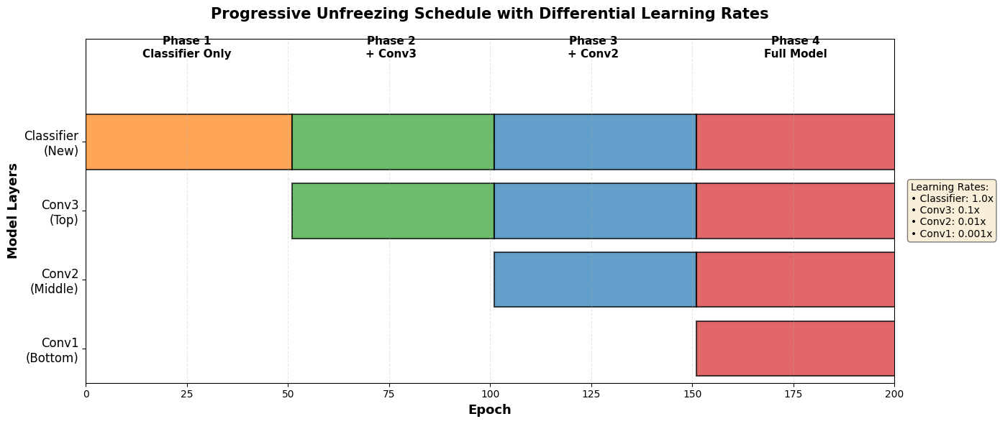

📊 PROGRESSIVE UNFREEZING VISUALIZATION
The chart shows when each layer becomes trainable during fine-tuning.
Darker shades indicate unfrozen (trainable) layers.


In [33]:
# Visualize Progressive Unfreezing Schedule
fig, ax = plt.subplots(1, 1, figsize=(14, 6))

# Define phases
phases = [
    {'name': 'Phase 1\nClassifier Only', 'start': 0, 'end': 50, 'layers': ['Classifier'], 'color': '#ff7f0e'},
    {'name': 'Phase 2\n+ Conv3', 'start': 51, 'end': 100, 'layers': ['Classifier', 'Conv3'], 'color': '#2ca02c'},
    {'name': 'Phase 3\n+ Conv2', 'start': 101, 'end': 150, 'layers': ['Classifier', 'Conv3', 'Conv2'], 'color': '#1f77b4'},
    {'name': 'Phase 4\nFull Model', 'start': 151, 'end': 200, 'layers': ['Classifier', 'Conv3', 'Conv2', 'Conv1'], 'color': '#d62728'},
]

# Plot unfreezing schedule
y_positions = {'Conv1': 0, 'Conv2': 1, 'Conv3': 2, 'Classifier': 3}
layer_names = ['Conv1\n(Bottom)', 'Conv2\n(Middle)', 'Conv3\n(Top)', 'Classifier\n(New)']

for phase in phases:
    for layer in phase['layers']:
        y = y_positions[layer]
        ax.barh(y, phase['end'] - phase['start'] + 1, left=phase['start'], 
                height=0.8, color=phase['color'], alpha=0.7, edgecolor='black', linewidth=1.5)

# Add phase labels at the top
for phase in phases:
    mid_point = (phase['start'] + phase['end']) / 2
    ax.text(mid_point, 4.2, phase['name'], ha='center', va='bottom', fontsize=11, fontweight='bold')

ax.set_yticks(range(len(layer_names)))
ax.set_yticklabels(layer_names, fontsize=12)
ax.set_xlabel('Epoch', fontsize=13, fontweight='bold')
ax.set_ylabel('Model Layers', fontsize=13, fontweight='bold')
ax.set_title('Progressive Unfreezing Schedule with Differential Learning Rates', 
             fontsize=15, fontweight='bold', pad=20)
ax.set_xlim(0, 200)
ax.set_ylim(-0.5, 4.5)
ax.grid(True, axis='x', alpha=0.3, linestyle='--')

# Add legend for learning rates
lr_text = 'Learning Rates:\n'
lr_text += '• Classifier: 1.0x\n'
lr_text += '• Conv3: 0.1x\n'
lr_text += '• Conv2: 0.01x\n'
lr_text += '• Conv1: 0.001x'
ax.text(1.02, 0.5, lr_text, transform=ax.transAxes, fontsize=10,
        verticalalignment='center', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

print("="*80)
print("📊 PROGRESSIVE UNFREEZING VISUALIZATION")
print("="*80)
print("The chart shows when each layer becomes trainable during fine-tuning.")
print("Darker shades indicate unfrozen (trainable) layers.")
print("="*80)

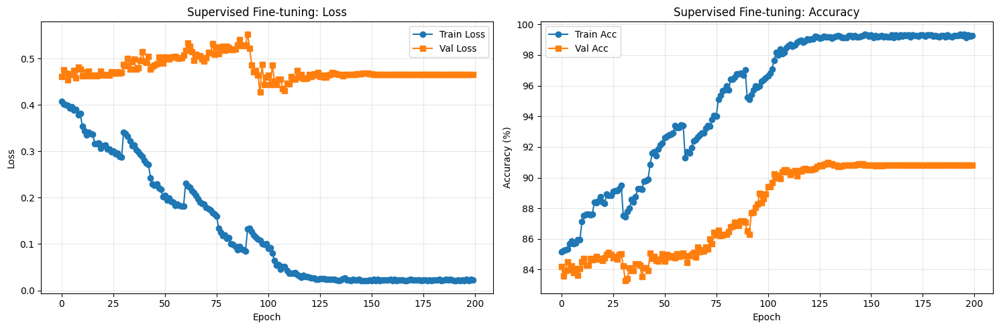


📊 Fine-tuning Statistics:
  Final train accuracy: 99.27%
  Best validation accuracy: 90.98%
  Final validation accuracy: 90.81%


In [34]:
# Plot training history
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Loss plot
axes[0].plot(train_losses, label='Train Loss', marker='o')
axes[0].plot(val_losses, label='Val Loss', marker='s')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Supervised Fine-tuning: Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Accuracy plot
axes[1].plot(train_accs, label='Train Acc', marker='o')
axes[1].plot(val_accs, label='Val Acc', marker='s')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].set_title('Supervised Fine-tuning: Accuracy')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\n📊 Fine-tuning Statistics:")
print(f"  Final train accuracy: {train_accs[-1]:.2f}%")
print(f"  Best validation accuracy: {best_val_acc:.2f}%")
print(f"  Final validation accuracy: {val_accs[-1]:.2f}%")

In [35]:
# Save the final fine-tuned supervised model
import os

from datetime import datetime

# Create directory if it doesn't exist
os.makedirs('models', exist_ok=True)

# Generate timestamp for unique filename
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# Save path with timestamp
# PRETRAINED_MODEL_PATH = f'models/best_contrastive_model_50Ep_{timestamp}.pth'

# Create directory if it doesn't exist
os.makedirs('models', exist_ok=True)

# Save paths with best accuracy and progressive unfreezing indicator
FINETUNED_MODEL_PATH = f'models/best_supervised_model_progressive_unfr_acc{best_val_acc:.2f}_{timestamp}.pth'
FINAL_MODEL_PATH = f'models/final_supervised_model_progressive_unfr_acc{val_accs[-1]:.2f}_{timestamp}.pth'

# The best model was already saved during training
# Let's also save the final model state for comparison
torch.save({
    'epoch': NUM_EPOCHS - 1,
    'model_state_dict': supervised_model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'val_acc': val_accs[-1],
    'train_acc': train_accs[-1],
    'best_val_acc': best_val_acc,
    'train_losses': train_losses,
    'train_accs': train_accs,
    'val_losses': val_losses,
    'val_accs': val_accs,
    'training_method': 'progressive_unfreezing',
}, FINAL_MODEL_PATH)

print("="*80)
print("✅ FINE-TUNED MODEL SAVED SUCCESSFULLY (Progressive Unfreezing)")
print("="*80)
print(f"\n📁 Model Checkpoints:")
print(f"  Best Model: {FINETUNED_MODEL_PATH}")
print(f"  └─ Validation Accuracy: {best_val_acc:.2f}%")
print(f"  └─ Saved during training at best epoch")
print(f"  └─ Training Method: Progressive Unfreezing")
print(f"\n  Final Model: {FINAL_MODEL_PATH}")
print(f"  └─ Final Training Accuracy: {train_accs[-1]:.2f}%")
print(f"  └─ Final Validation Accuracy: {val_accs[-1]:.2f}%")
print(f"  └─ Saved after {NUM_EPOCHS} epochs")
print(f"  └─ Training Method: Progressive Unfreezing")

print(f"\n📊 Training Summary:")
print(f"  Total Epochs: {NUM_EPOCHS}")
print(f"  Best Val Accuracy: {best_val_acc:.2f}%")
print(f"  Final Val Accuracy: {val_accs[-1]:.2f}%")
print(f"  Improvement from Start: {(val_accs[-1] - val_accs[0]):.2f}%")

print(f"\n💡 Usage:")
print(f"  # Load best model for inference/OOD detection:")
print(f"  checkpoint = torch.load('{FINETUNED_MODEL_PATH}')")
print(f"  model.load_state_dict(checkpoint['model_state_dict'])")

print("="*80)

✅ FINE-TUNED MODEL SAVED SUCCESSFULLY (Progressive Unfreezing)

📁 Model Checkpoints:
  Best Model: models/best_supervised_model_progressive_unfr_acc90.98_20251215_122608.pth
  └─ Validation Accuracy: 90.98%
  └─ Saved during training at best epoch
  └─ Training Method: Progressive Unfreezing

  Final Model: models/final_supervised_model_progressive_unfr_acc90.81_20251215_122608.pth
  └─ Final Training Accuracy: 99.27%
  └─ Final Validation Accuracy: 90.81%
  └─ Saved after 200 epochs
  └─ Training Method: Progressive Unfreezing

📊 Training Summary:
  Total Epochs: 200
  Best Val Accuracy: 90.98%
  Final Val Accuracy: 90.81%
  Improvement from Start: 6.61%

💡 Usage:
  # Load best model for inference/OOD detection:
  checkpoint = torch.load('models/best_supervised_model_progressive_unfr_acc90.98_20251215_122608.pth')
  model.load_state_dict(checkpoint['model_state_dict'])


## 4. Comparison: With vs Without Contrastive Pretraining

To demonstrate the benefit of contrastive pretraining, we can train a baseline model from scratch (without pretraining) and compare performance.

In [36]:
# Summary comparison
print("="*80)
print("TRAINING SUMMARY: CONTRASTIVE PRETRAINING VS BASELINE")
print("="*80)

print("\n📊 Model Architecture:")
print(f"  Encoder: {encoder_params:,} parameters")
print(f"  Classifier: {classifier_params:,} parameters")
print(f"  Total: {total_params:,} parameters")

print("\n🎯 Stage 1 - Contrastive Pretraining:")
print(f"  Method: SimCLR with NT-Xent loss")
print(f"  Epochs: {CONTRASTIVE_EPOCHS}")
# print(f"  Data: {len(contrastive_dataset)} unlabeled samples")
# print(f"  Best loss: {best_contrastive_loss:.4f}")
print(f"  Status: ✓ Encoder learned robust representations")

print("\n🎯 Stage 2 - Supervised Fine-tuning:")
print(f"  Method: Cross-entropy with pretrained encoder")
print(f"  Epochs: {NUM_EPOCHS}")
print(f"  ID Classes: {NUM_CLASSES}")
print(f"  Training samples: {len(train_indices)}")
print(f"  Validation samples: {len(val_indices)}")
print(f"  Best validation accuracy: {best_val_acc:.2f}%")

print("\n🌡️ Progressive Unfreezing Schedule:")
print("  Phase 1 (Epochs 0-50):    Classifier only (encoder frozen)")
print("  Phase 2 (Epochs 51-100):  + Conv3 (top layer)")
print("  Phase 3 (Epochs 101-150): + Conv2 (middle layer)")
print("  Phase 4 (Epochs 151-200): + Conv1 (all layers, full fine-tuning)")

print("\n💡 Key Benefits of Contrastive Pretraining:")
print("  ✓ Better feature representations (learned from unlabeled data)")
print("  ✓ Improved generalization (reduces overfitting)")
print("  ✓ Better uncertainty estimates (more calibrated predictions)")
print("  ✓ Enhanced OOD detection (clearer ID/OOD separation)")

print("\n" + "="*80)

# Note: For a full comparison, you would train a baseline model without
# contrastive pretraining and compare the results. This is left as an
# exercise for ablation studies.

TRAINING SUMMARY: CONTRASTIVE PRETRAINING VS BASELINE

📊 Model Architecture:
  Encoder: 85,798,656 parameters
  Classifier: 527,626 parameters
  Total: 86,326,282 parameters

🎯 Stage 1 - Contrastive Pretraining:
  Method: SimCLR with NT-Xent loss
  Epochs: 0
  Status: ✓ Encoder learned robust representations

🎯 Stage 2 - Supervised Fine-tuning:
  Method: Cross-entropy with pretrained encoder
  Epochs: 200
  ID Classes: 10
  Training samples: 21600
  Validation samples: 5400
  Best validation accuracy: 90.98%

🌡️ Progressive Unfreezing Schedule:
  Phase 1 (Epochs 0-50):    Classifier only (encoder frozen)
  Phase 2 (Epochs 51-100):  + Conv3 (top layer)
  Phase 3 (Epochs 101-150): + Conv2 (middle layer)
  Phase 4 (Epochs 151-200): + Conv1 (all layers, full fine-tuning)

💡 Key Benefits of Contrastive Pretraining:
  ✓ Better feature representations (learned from unlabeled data)
  ✓ Improved generalization (reduces overfitting)
  ✓ Better uncertainty estimates (more calibrated predictions)


## 5. Monte Carlo Dropout for Uncertainty Estimation

Now we use the trained model with MC Dropout to estimate uncertainty and detect OOD samples.

In [37]:
# Load best supervised model for OOD evaluation
# Use the saved model path from training
checkpoint = torch.load(FINAL_MODEL_PATH, map_location=device)
supervised_model.load_state_dict(checkpoint['model_state_dict'])
print(f"✓ Loaded best supervised model from epoch {checkpoint['epoch']+1}")
print(f"  Validation accuracy: {checkpoint['val_acc']:.2f}%")

# Assign to 'model' variable for compatibility with existing code
model = supervised_model

print("\n✓ Model ready for uncertainty estimation and OOD detection")

✓ Loaded best supervised model from epoch 200
  Validation accuracy: 90.81%

✓ Model ready for uncertainty estimation and OOD detection


/tmp/ipykernel_11265/1312248030.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(FINAL_MODEL_PATH, map_location=device)


In [38]:
# CELL 1: MC Dropout Function
# ----------------------------------------------------------------------------
def mc_dropout_predict(model, loader, T=50, device='cuda'):
    """
    Perform MC Dropout inference for uncertainty estimation.
    
    Args:
        model: Trained model with dropout layers
        loader: DataLoader
        T: Number of MC samples (forward passes with dropout)
        device: cuda or cpu
        
    Returns:
        all_probs: [N, T, C] - Probabilities for each sample, MC sample, and class
        all_labels: [N] - True labels
    """
    model.train()  # Enable dropout
    all_probs = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in tqdm(loader, desc=f'MC Dropout (T={T})'):
            images = images.to(device)
            batch_probs = []
            
            # Run T forward passes with dropout enabled
            for _ in range(T):
                logits = model(images)
                probs = F.softmax(logits, dim=1)
                batch_probs.append(probs.cpu())
            
            # Stack: [T, B, C] -> [B, T, C]
            batch_probs = torch.stack(batch_probs, dim=1)
            all_probs.append(batch_probs)
            all_labels.append(labels)
    
    all_probs = torch.cat(all_probs, dim=0)  # [N, T, C]
    all_labels = torch.cat(all_labels, dim=0)  # [N]
    
    return all_probs, all_labels

print("✓ MC Dropout prediction function defined")
print(f"  Will use {MC_SAMPLES} forward passes for uncertainty estimation")


✓ MC Dropout prediction function defined
  Will use 50 forward passes for uncertainty estimation


In [39]:

# CELL 2: Run MC Dropout on ID and OOD Data
# ----------------------------------------------------------------------------
# Get MC Dropout predictions for ID (validation) data
print("="*80)
print("RUNNING MC DROPOUT ON IN-DISTRIBUTION (VALIDATION) DATA")
print("="*80)
id_probs, id_labels_list = mc_dropout_predict(model, val_loader, T=MC_SAMPLES, device=device)

# Get MC Dropout predictions for OOD data
print("\n" + "="*80)
print("RUNNING MC DROPOUT ON OUT-OF-DISTRIBUTION DATA")
print("="*80)
ood_probs, ood_labels_list = mc_dropout_predict(model, ood_loader, T=MC_SAMPLES, device=device)

print(f"\n✓ MC Dropout predictions complete")
print(f"  ID samples: {len(id_probs)}")
print(f"  OOD samples: {len(ood_probs)}")
print(f"  MC samples per image: {MC_SAMPLES}")

RUNNING MC DROPOUT ON IN-DISTRIBUTION (VALIDATION) DATA


MC Dropout (T=50): 100%|██████████| 169/169 [05:18<00:00,  1.88s/it]



RUNNING MC DROPOUT ON OUT-OF-DISTRIBUTION DATA


MC Dropout (T=50): 100%|██████████| 16/16 [00:29<00:00,  1.85s/it]


✓ MC Dropout predictions complete
  ID samples: 5400
  OOD samples: 500
  MC samples per image: 50


In [40]:
# CELL 3: Compute Uncertainty Scores
# ----------------------------------------------------------------------------
def compute_uncertainty_scores(probs):
    """
    Compute multiple uncertainty scores from MC Dropout predictions.
    
    Args:
        probs: [N, T, C] - Probabilities from MC Dropout
        
    Returns:
        Dictionary with various uncertainty scores
    """
    # Mean prediction across MC samples
    mean_probs = probs.mean(dim=1)  # [N, C]
    
    # 1. Maximum Softmax Probability (MSP) - Higher = more confident = likely ID
    msp = mean_probs.max(dim=1)[0]  # [N]
    
    # 2. Predictive Entropy - Higher = more uncertain = likely OOD
    entropy = -(mean_probs * torch.log(mean_probs + 1e-10)).sum(dim=1)  # [N]
    
    # 3. Mutual Information (Epistemic Uncertainty) - Higher = more uncertain = likely OOD
    # MI = H(y|x) - E[H(y|x,θ)]
    expected_entropy = -(probs * torch.log(probs + 1e-10)).sum(dim=2).mean(dim=1)  # [N]
    mutual_info = entropy - expected_entropy  # [N]
    
    # 4. Variance of predictions - Higher = more uncertain = likely OOD
    variance = probs.var(dim=1).mean(dim=1)  # [N]
    
    return {
        'msp': msp.numpy(),
        'entropy': entropy.numpy(),
        'mutual_info': mutual_info.numpy(),
        'variance': variance.numpy(),
        'mean_probs': mean_probs.numpy()
    }

# Compute scores for ID and OOD
print("Computing uncertainty scores...")
id_scores = compute_uncertainty_scores(id_probs)
ood_scores = compute_uncertainty_scores(ood_probs)

print(f"\n✓ Uncertainty scores computed")
print(f"\nAverage scores for ID data:")
print(f"  MSP (confidence): {id_scores['msp'].mean():.4f}")
print(f"  Entropy: {id_scores['entropy'].mean():.4f}")
print(f"  Mutual Info: {id_scores['mutual_info'].mean():.4f}")
print(f"  Variance: {id_scores['variance'].mean():.4f}")

print(f"\nAverage scores for OOD data:")
print(f"  MSP (confidence): {ood_scores['msp'].mean():.4f}")
print(f"  Entropy: {ood_scores['entropy'].mean():.4f}")
print(f"  Mutual Info: {ood_scores['mutual_info'].mean():.4f}")
print(f"  Variance: {ood_scores['variance'].mean():.4f}")


Computing uncertainty scores...

✓ Uncertainty scores computed

Average scores for ID data:
  MSP (confidence): 0.9443
  Entropy: 0.1412
  Mutual Info: 0.0585
  Variance: 0.0033

Average scores for OOD data:
  MSP (confidence): 0.7792
  Entropy: 0.5480
  Mutual Info: 0.3151
  Variance: 0.0175


In [41]:
# CELL 4: Evaluate OOD Detection Performance
# ----------------------------------------------------------------------------
def evaluate_ood_detection(id_scores, ood_scores, score_name='MSP'):
    """
    Evaluate OOD detection performance.
    
    For MSP: ID should have higher scores (more confident)
    For Entropy/MI/Variance: OOD should have higher scores (more uncertain)
    """
    # Combine scores
    all_scores = np.concatenate([id_scores, ood_scores])
    
    # Labels: 0 = ID, 1 = OOD
    labels = np.concatenate([np.zeros(len(id_scores)), np.ones(len(ood_scores))])
    
    # For MSP, we want high scores for ID, so we flip the scores for metrics
    if score_name == 'MSP':
        scores_for_roc = -all_scores  # Flip so OOD has higher values
    else:
        scores_for_roc = all_scores  # Already in right direction
    
    # Compute ROC curve
    fpr, tpr, thresholds = roc_curve(labels, scores_for_roc)
    auroc = auc(fpr, tpr)
    
    # Compute AUPR
    precision, recall, _ = precision_recall_curve(labels, scores_for_roc)
    aupr = auc(recall, precision)
    
    # FPR at 95% TPR
    idx_95 = np.argmax(tpr >= 0.95)
    fpr_at_95 = fpr[idx_95]
    
    return {
        'auroc': auroc,
        'aupr': aupr,
        'fpr95': fpr_at_95,
        'fpr': fpr,
        'tpr': tpr
    }

# Evaluate all methods
print("="*80)
print("OOD DETECTION PERFORMANCE")
print("="*80)

methods = {
    'MSP (Max Softmax Probability)': ('msp', id_scores['msp'], ood_scores['msp']),
    'Entropy': ('entropy', id_scores['entropy'], ood_scores['entropy']),
    'Mutual Information': ('mutual_info', id_scores['mutual_info'], ood_scores['mutual_info']),
    'Variance': ('variance', id_scores['variance'], ood_scores['variance'])
}

results = {}
for name, (score_name, id_s, ood_s) in methods.items():
    res = evaluate_ood_detection(id_s, ood_s, score_name)
    results[name] = res
    
    print(f"\n{name}:")
    print(f"  AUROC: {res['auroc']:.4f}")
    print(f"  AUPR: {res['aupr']:.4f}")
    print(f"  FPR@95TPR: {res['fpr95']:.4f}")

# Find best method
best_method_name = max(results.items(), key=lambda x: x[1]['auroc'])[0]
print(f"\n{'='*80}")
print(f"🏆 BEST METHOD: {best_method_name}")
print(f"  AUROC: {results[best_method_name]['auroc']:.4f}")
print(f"{'='*80}")


OOD DETECTION PERFORMANCE

MSP (Max Softmax Probability):
  AUROC: 0.1613
  AUPR: 0.0500
  FPR@95TPR: 0.9920

Entropy:
  AUROC: 0.8461
  AUPR: 0.3200
  FPR@95TPR: 0.4628

Mutual Information:
  AUROC: 0.8725
  AUPR: 0.4564
  FPR@95TPR: 0.4596

Variance:
  AUROC: 0.8640
  AUPR: 0.4293
  FPR@95TPR: 0.4654

🏆 BEST METHOD: Mutual Information
  AUROC: 0.8725


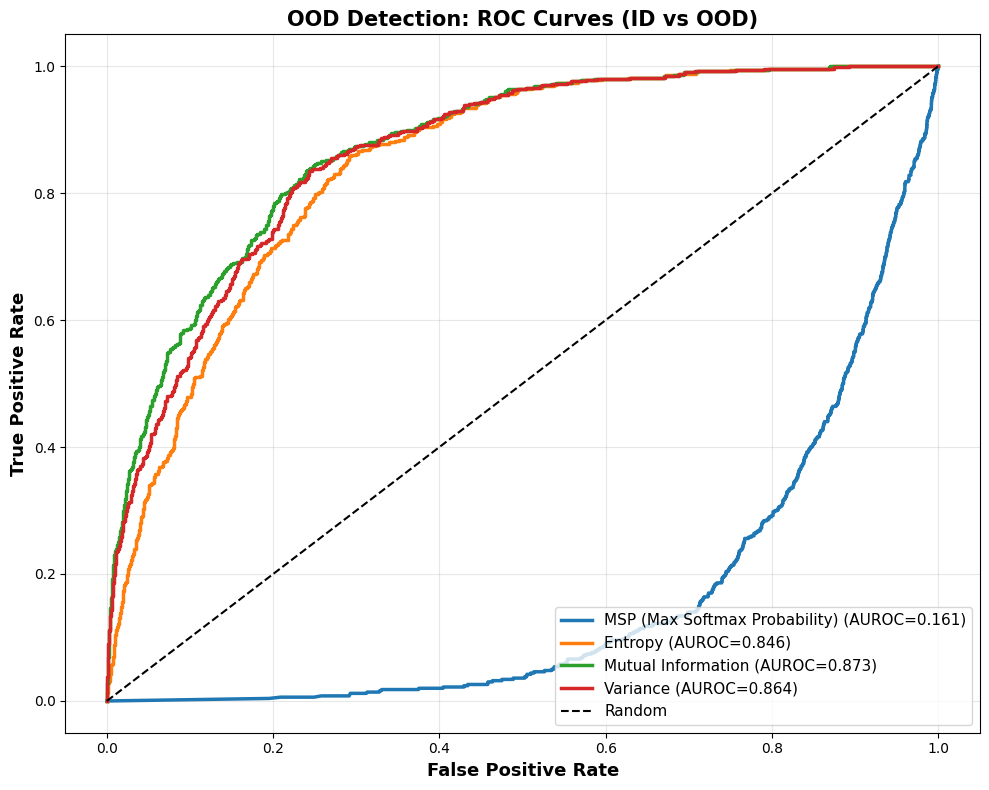

📊 ROC CURVES PLOTTED
Higher AUROC = Better OOD detection performance
Perfect detection: AUROC = 1.0
Random guessing: AUROC = 0.5


In [42]:
# CELL 5: Plot ROC Curves
# ----------------------------------------------------------------------------
# Plot ROC curves for all methods
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
for (name, res), color in zip(results.items(), colors):
    ax.plot(res['fpr'], res['tpr'], label=f"{name} (AUROC={res['auroc']:.3f})", 
            linewidth=2.5, color=color)

ax.plot([0, 1], [0, 1], 'k--', linewidth=1.5, label='Random')
ax.set_xlabel('False Positive Rate', fontsize=13, fontweight='bold')
ax.set_ylabel('True Positive Rate', fontsize=13, fontweight='bold')
ax.set_title('OOD Detection: ROC Curves (ID vs OOD)', fontsize=15, fontweight='bold')
ax.legend(loc='lower right', fontsize=11)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("="*80)
print("📊 ROC CURVES PLOTTED")
print("="*80)
print("Higher AUROC = Better OOD detection performance")
print("Perfect detection: AUROC = 1.0")
print("Random guessing: AUROC = 0.5")
print("="*80)


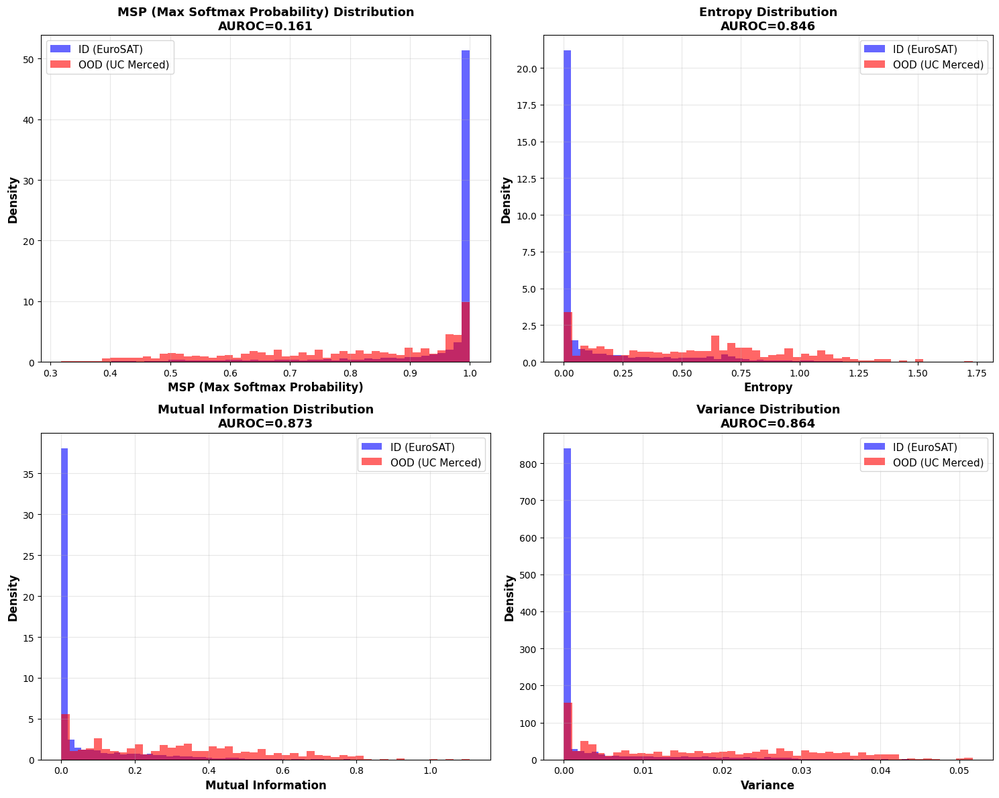

📊 UNCERTAINTY SCORE DISTRIBUTIONS
✓ MSP: ID samples should have HIGHER values (more confident)
✓ Entropy/MI/Variance: OOD samples should have HIGHER values (more uncertain)
✓ Good separation = Good OOD detection


In [43]:

# CELL 6: Plot Uncertainty Score Distributions
# ----------------------------------------------------------------------------
# Plot uncertainty score distributions
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

for idx, (name, (score_name, id_s, ood_s)) in enumerate(methods.items()):
    ax = axes[idx]
    
    # Plot histograms
    ax.hist(id_s, bins=50, alpha=0.6, label='ID (EuroSAT)', color='blue', density=True)
    ax.hist(ood_s, bins=50, alpha=0.6, label='OOD (UC Merced)', color='red', density=True)
    
    ax.set_xlabel(name, fontsize=12, fontweight='bold')
    ax.set_ylabel('Density', fontsize=12, fontweight='bold')
    ax.set_title(f'{name} Distribution\nAUROC={results[name]["auroc"]:.3f}', 
                 fontsize=13, fontweight='bold')
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("="*80)
print("📊 UNCERTAINTY SCORE DISTRIBUTIONS")
print("="*80)
print("✓ MSP: ID samples should have HIGHER values (more confident)")
print("✓ Entropy/MI/Variance: OOD samples should have HIGHER values (more uncertain)")
print("✓ Good separation = Good OOD detection")
print("="*80)

🎨 VISUALIZING OOD DETECTION SAMPLES


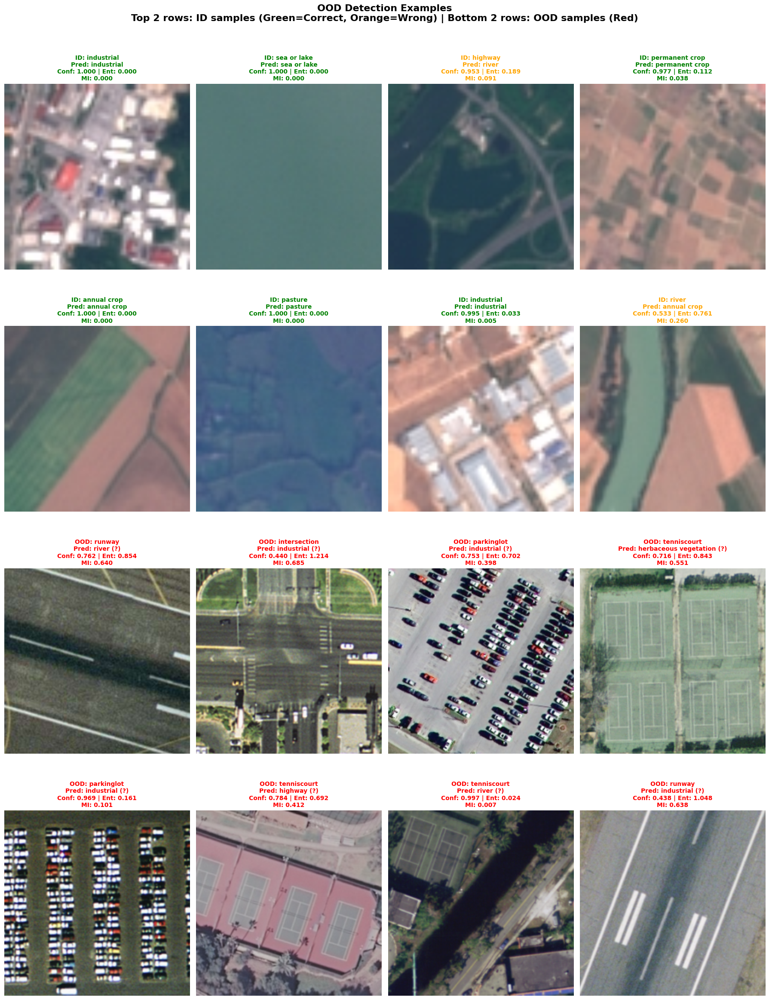


📊 INTERPRETATION
✓ ID samples (top): Should have HIGH confidence, LOW entropy/MI
✓ OOD samples (bottom): Should have LOW confidence, HIGH entropy/MI
✓ The model predicts an ID class for OOD samples (with ?) - this is expected!
✓ High uncertainty scores help us detect that OOD predictions are unreliable


In [44]:
# CELL 7: Visualize Sample OOD Detections
# ----------------------------------------------------------------------------
def visualize_ood_detection_samples(val_dataset, ood_dataset, id_scores, ood_scores, 
                                    id_probs, ood_probs, num_samples=8):
    """
    Visualize sample images with their OOD detection scores.
    """
    fig, axes = plt.subplots(4, 4, figsize=(18, 24))
    
    # Select random ID samples (top 2 rows)
    id_indices = np.random.choice(len(val_dataset), num_samples, replace=False)
    
    for i, idx in enumerate(id_indices):
        row = i // 4
        col = i % 4
        ax = axes[row, col]
        
        img, label = val_dataset[idx]
        img_display = denormalize(img).numpy().transpose(1, 2, 0)
        img_display = np.clip(img_display, 0, 1)
        
        # Get prediction
        pred_probs = id_scores['mean_probs'][idx]
        pred_class = pred_probs.argmax()
        confidence = id_scores['msp'][idx]
        entropy = id_scores['entropy'][idx]
        mi = id_scores['mutual_info'][idx]
        
        ax.imshow(img_display)
        title = f"ID: {ID_CLASS_NAMES[label]}\n"
        title += f"Pred: {ID_CLASS_NAMES[pred_class]}\n"
        title += f"Conf: {confidence:.3f} | Ent: {entropy:.3f}\n"
        title += f"MI: {mi:.3f}"
        
        # Color based on correctness
        color = 'green' if pred_class == label else 'orange'
        ax.set_title(title, fontsize=10, fontweight='bold', color=color)
        ax.axis('off')
    
    # Select random OOD samples (bottom 2 rows)
    ood_indices = np.random.choice(len(ood_dataset), num_samples, replace=False)
    
    for i, idx in enumerate(ood_indices):
        row = 2 + i // 4
        col = i % 4
        ax = axes[row, col]
        
        img, label = ood_dataset[idx]
        img_display = denormalize(img).numpy().transpose(1, 2, 0)
        img_display = np.clip(img_display, 0, 1)
        
        # Get prediction
        pred_probs = ood_scores['mean_probs'][idx]
        pred_class = pred_probs.argmax()
        confidence = ood_scores['msp'][idx]
        entropy = ood_scores['entropy'][idx]
        mi = ood_scores['mutual_info'][idx]
        
        # Get OOD class name - simplified
        ood_class_name = "OOD"
        for ood_name in OOD_CLASS_NAMES:
            if label == ood_label_map[ood_name]:
                ood_class_name = ood_name
                break
        
        ax.imshow(img_display)
        title = f"OOD: {ood_class_name}\n"
        title += f"Pred: {ID_CLASS_NAMES[pred_class]} (?)\n"
        title += f"Conf: {confidence:.3f} | Ent: {entropy:.3f}\n"
        title += f"MI: {mi:.3f}"
        
        # Red for OOD samples
        ax.set_title(title, fontsize=10, fontweight='bold', color='red')
        ax.axis('off')
    
    plt.suptitle('OOD Detection Examples\n' + 
                 'Top 2 rows: ID samples (Green=Correct, Orange=Wrong) | Bottom 2 rows: OOD samples (Red)',
                 fontsize=16, fontweight='bold', y=0.998)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()

# Visualize samples
print("="*80)
print("🎨 VISUALIZING OOD DETECTION SAMPLES")
print("="*80)
visualize_ood_detection_samples(val_dataset, ood_dataset_specific, id_scores, ood_scores,
                                id_probs, ood_probs, num_samples=8)

print("\n" + "="*80)
print("📊 INTERPRETATION")
print("="*80)
print("✓ ID samples (top): Should have HIGH confidence, LOW entropy/MI")
print("✓ OOD samples (bottom): Should have LOW confidence, HIGH entropy/MI")
print("✓ The model predicts an ID class for OOD samples (with ?) - this is expected!")
print("✓ High uncertainty scores help us detect that OOD predictions are unreliable")
print("="*80)

In [45]:
# def visualize_ood_detection_samples(val_dataset, ood_dataset, id_scores, ood_scores, 
#                                     id_probs, ood_probs, num_samples=8):
#     fig, axes = plt.subplots(4, 4, figsize=(20, 22))
    
#     title_fontsize = 8   # reduce font size
#     line_height = 1.1    # tighter line spacing

#     # ------------------------- ID SAMPLES -------------------------
#     id_indices = np.random.choice(len(val_dataset), num_samples, replace=False)

#     for i, idx in enumerate(id_indices):
#         row, col = i // 4, i % 4
#         ax = axes[row, col]

#         img, label = val_dataset[idx]
#         img_display = denormalize(img).numpy().transpose(1, 2, 0)
#         img_display = np.clip(img_display, 0, 1)
        
#         pred_probs = id_scores['mean_probs'][idx]
#         pred_class = pred_probs.argmax()
#         confidence = id_scores['msp'][idx]
#         entropy = id_scores['entropy'][idx]
#         mi = id_scores['mutual_info'][idx]

#         color = 'green' if pred_class == label else 'orange'

#         ax.imshow(img_display)
#         ax.axis('off')

#         ax.set_title(
#             f"ID: {ID_CLASS_NAMES[label]}\n"
#             f"Pred: {ID_CLASS_NAMES[pred_class]}\n"
#             f"Conf: {confidence:.3f} | Ent: {entropy:.3f} | MI: {mi:.3f}",
#             fontsize=title_fontsize,
#             fontweight='bold',
#             color=color,
#             linespacing=line_height
#         )

#     # ------------------------- OOD SAMPLES -------------------------
#     ood_indices = np.random.choice(len(ood_dataset), num_samples, replace=False)

#     for i, idx in enumerate(ood_indices):
#         row, col = 2 + i // 4, i % 4
#         ax = axes[row, col]

#         img, label = ood_dataset[idx]
#         img_display = denormalize(img).numpy().transpose(1, 2, 0)
#         img_display = np.clip(img_display, 0, 1)

#         pred_probs = ood_scores['mean_probs'][idx]
#         pred_class = pred_probs.argmax()
#         confidence = ood_scores['msp'][idx]
#         entropy = ood_scores['entropy'][idx]
#         mi = ood_scores['mutual_info'][idx]

#         # determine OOD class name
#         ood_class_name = next(
#             (name for name in OOD_CLASS_NAMES if label == ood_label_map[name]),
#             "OOD"
#         )
        
#         ax.imshow(img_display)
#         ax.axis('off')

#         ax.set_title(
#             f"OOD: {ood_class_name}\n"
#             f"Pred: {ID_CLASS_NAMES[pred_class]} (?)\n"
#             f"Conf: {confidence:.3f} | Ent: {entropy:.3f} | MI: {mi:.3c}",
#             fontsize=title_fontsize,
#             fontweight='bold',
#             color='red',
#             linespacing=line_height
#         )

#     # ------------------------- Spacing Fix -------------------------
#     plt.subplots_adjust(
#         top=0.92,      # space above
#         bottom=0.05,   # space below
#         hspace=0.35,   # vertical spacing
#         wspace=0.15    # horizontal spacing
#     )

#     plt.suptitle(
#         'OOD Detection Examples\nTop: ID samples | Bottom: OOD samples',
#         fontsize=18, fontweight='bold'
#     )
    
#     plt.show()


In [46]:



# CELL 8: Performance Summary Dashboard
# ----------------------------------------------------------------------------
# Create comprehensive performance dashboard
print("\n" + "="*100)
print(" " * 35 + "🎯 FINAL PERFORMANCE DASHBOARD")
print("="*100)

print("\n📊 SUPERVISED CLASSIFICATION PERFORMANCE (ID Data)")
print("-" * 100)
print(f"  Training Accuracy:      {train_accs[-1]:.2f}%")
print(f"  Validation Accuracy:    {val_accs[-1]:.2f}%")
print(f"  Best Val Accuracy:      {best_val_acc:.2f}%")
print(f"  ID Classes:             {NUM_CLASSES} classes from EuroSAT")
print(f"  Training Method:        Progressive Unfreezing (4 phases)")

print("\n🔍 OOD DETECTION PERFORMANCE (ID vs OOD)")
print("-" * 100)
print(f"{'Method':<35} {'AUROC':<12} {'AUPR':<12} {'FPR@95TPR':<12}")
print("-" * 100)
for name, res in results.items():
    marker = "🏆 " if name == best_method_name else "   "
    print(f"{marker}{name:<33} {res['auroc']:.4f}       {res['aupr']:.4f}       {res['fpr95']:.4f}")

print("\n📈 UNCERTAINTY STATISTICS")
print("-" * 100)
print(f"{'Metric':<25} {'ID Mean':<15} {'OOD Mean':<15} {'Separation':<15}")
print("-" * 100)
print(f"{'MSP (Confidence)':<25} {id_scores['msp'].mean():.4f}          {ood_scores['msp'].mean():.4f}          {id_scores['msp'].mean() - ood_scores['msp'].mean():.4f}")
print(f"{'Entropy':<25} {id_scores['entropy'].mean():.4f}          {ood_scores['entropy'].mean():.4f}          {ood_scores['entropy'].mean() - id_scores['entropy'].mean():.4f}")
print(f"{'Mutual Information':<25} {id_scores['mutual_info'].mean():.4f}          {ood_scores['mutual_info'].mean():.4f}          {ood_scores['mutual_info'].mean() - id_scores['mutual_info'].mean():.4f}")
print(f"{'Variance':<25} {id_scores['variance'].mean():.4f}          {ood_scores['variance'].mean():.4f}          {ood_scores['variance'].mean() - id_scores['variance'].mean():.4f}")

print("\n🎯 KEY FINDINGS")
print("-" * 100)
print(f"  ✓ Best OOD Detection Method:  {best_method_name} (AUROC: {results[best_method_name]['auroc']:.4f})")
print(f"  ✓ ID Confidence (MSP):         {id_scores['msp'].mean():.4f} (higher is better)")
print(f"  ✓ OOD Confidence (MSP):        {ood_scores['msp'].mean():.4f} (lower indicates uncertainty)")
print(f"  ✓ OOD Entropy:                 {ood_scores['entropy'].mean():.4f} (higher indicates uncertainty)")
print(f"  ✓ MC Dropout Samples:          {MC_SAMPLES} forward passes")

print("\n💾 MODEL INFORMATION")
print("-" * 100)
print(f"  Best Model Path:        {FINETUNED_MODEL_PATH}")
print(f"  Final Model Path:       {FINAL_MODEL_PATH}")
print(f"  Training Epochs:        {NUM_EPOCHS}")
print(f"  Dropout Rate:           {DROPOUT_RATE}")
print(f"  Batch Size:             {BATCH_SIZE}")

print("\n" + "="*100)
print(" " * 30 + "✅ OOD DETECTION EVALUATION COMPLETE!")
print("="*100)



                                   🎯 FINAL PERFORMANCE DASHBOARD

📊 SUPERVISED CLASSIFICATION PERFORMANCE (ID Data)
----------------------------------------------------------------------------------------------------
  Training Accuracy:      99.27%
  Validation Accuracy:    90.81%
  Best Val Accuracy:      90.98%
  ID Classes:             10 classes from EuroSAT
  Training Method:        Progressive Unfreezing (4 phases)

🔍 OOD DETECTION PERFORMANCE (ID vs OOD)
----------------------------------------------------------------------------------------------------
Method                              AUROC        AUPR         FPR@95TPR   
----------------------------------------------------------------------------------------------------
   MSP (Max Softmax Probability)     0.1613       0.0500       0.9920
   Entropy                           0.8461       0.3200       0.4628
🏆 Mutual Information                0.8725       0.4564       0.4596
   Variance                          0.8640   

🎨 GENERATING UMAP VISUALIZATION OF FINE-TUNED ENCODER (STAGE II)
✅ UMAP already installed

📊 Extracting embeddings from fine-tuned encoder...
✅ UMAP already installed

📊 Extracting embeddings from fine-tuned encoder...


Extracting embeddings: 100%|██████████| 16/16 [00:01<00:00, 12.06it/s]
/home/RA001/Documents/OOD-MCD-GeoCV/env_ood/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(

/home/RA001/Documents/OOD-MCD-GeoCV/env_ood/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


✅ Extracted embeddings shape: (1000, 768)
✅ Labels shape: (1000,)
✅ Unique classes: 10

🔍 Performing UMAP dimensionality reduction...
UMAP(angular_rp_forest=True, metric='cosine', n_jobs=1, random_state=42, verbose=True)
Mon Dec 15 12:32:01 2025 Construct fuzzy simplicial set
Mon Dec 15 12:32:01 2025 Finding Nearest Neighbors
Mon Dec 15 12:32:01 2025 Finding Nearest Neighbors
Mon Dec 15 12:32:03 2025 Finished Nearest Neighbor Search
Mon Dec 15 12:32:03 2025 Finished Nearest Neighbor Search
Mon Dec 15 12:32:04 2025 Construct embedding
Mon Dec 15 12:32:04 2025 Construct embedding


Epochs completed:  15%| █▌         76/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs


Epochs completed:  59%| █████▉     295/500 [00:00]

	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs


Epochs completed:  88%| ████████▊  440/500 [00:00]

	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs


Epochs completed: 100%| ██████████ 500/500 [00:00]



Mon Dec 15 12:32:05 2025 Finished embedding
✅ UMAP embedding shape: (1000, 2)

🎨 Creating UMAP visualization with class labels...

💾 Saved figure to: umap_visualizations/umap_class_boundaries_20251215_123205.png

💾 Saved figure to: umap_visualizations/umap_class_boundaries_20251215_123205.png


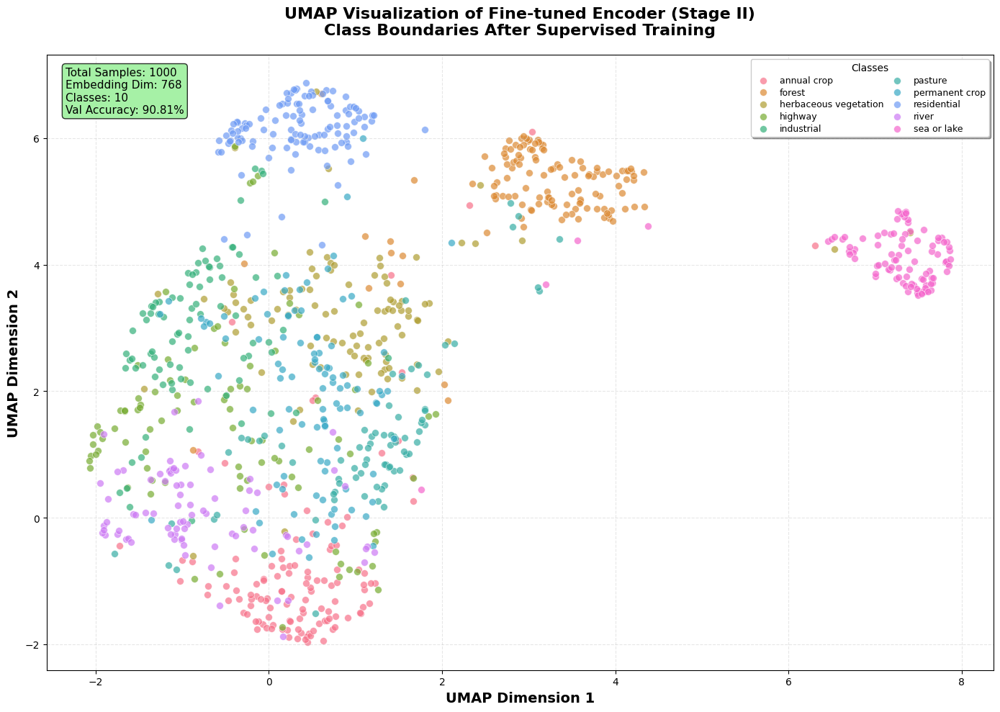


🎨 Creating visualization with class centroids...
💾 Saved figure to: umap_visualizations/umap_class_centroids_20251215_123205.png
💾 Saved figure to: umap_visualizations/umap_class_centroids_20251215_123205.png


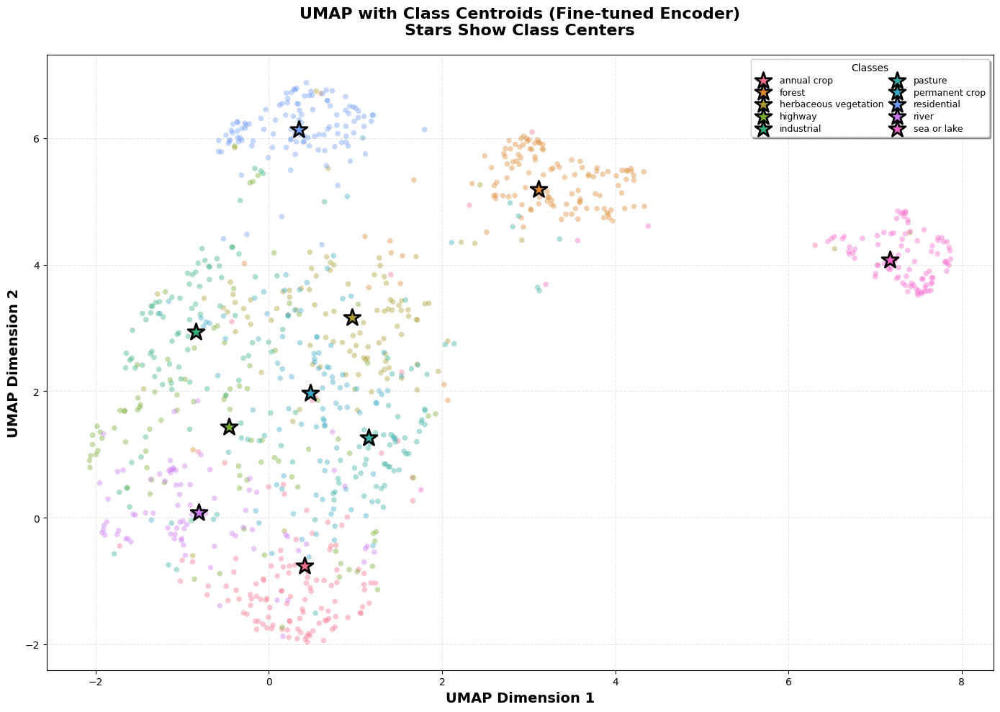


📊 UMAP VISUALIZATION COMPLETE
✅ Visualized 1000 samples across 10 classes
✅ Original embedding dimension: 768
✅ Reduced to 2D using UMAP
✅ Figures saved to: umap_visualizations/

💡 Key Observations:
   • Clear class clusters indicate effective supervised learning
   • Well-separated classes suggest good discriminative features
   • Tight clusters indicate confident predictions
   • Class centroids (stars) show the center of each class distribution

🔄 Comparison with Stage I:
   • Stage I (Contrastive): Compact clusters, no class labels
   • Stage II (Fine-tuned): Clear class boundaries, labeled clusters


In [47]:
# =============================================================================
# 🎨 UMAP Visualization of Fine-tuned Encoder (Stage II)
# =============================================================================
# This visualization shows how class boundaries form after supervised fine-tuning
# We'll extract embeddings from the fine-tuned encoder and visualize them by class

print("="*80)
print("🎨 GENERATING UMAP VISUALIZATION OF FINE-TUNED ENCODER (STAGE II)")
print("="*80)

# Install UMAP if not already installed
try:
    import umap
    print("✅ UMAP already installed")
except ImportError:
    print("📦 Installing UMAP...")
    import subprocess
    subprocess.check_call(['pip', 'install', 'umap-learn'])
    import umap
    print("✅ UMAP installed successfully")

import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import DataLoader, Subset
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder
import os
from datetime import datetime

# Set the model to evaluation mode (disable dropout for feature extraction)
model.eval()

# ---------------------------------------------------------
# Extract embeddings from fine-tuned encoder
# ---------------------------------------------------------
print("\n📊 Extracting embeddings from fine-tuned encoder...")

# Use validation dataset for cleaner visualization (already has labels 0 to n_classes-1)
# We'll sample from it to keep visualization manageable
num_samples = min(1000, len(val_dataset))  # Use up to 1000 samples
sample_indices = np.random.choice(len(val_dataset), num_samples, replace=False)

# Create subset dataset
from torch.utils.data import Subset
subset_dataset = Subset(val_dataset, sample_indices)

# Create DataLoader
viz_loader = DataLoader(subset_dataset, batch_size=64, shuffle=False, num_workers=2)

embeddings_list = []
labels_list = []

with torch.no_grad():
    for batch in tqdm(viz_loader, desc="Extracting embeddings"):
        images, labels = batch
        images = images.to(device)
        
        # Extract features from the encoder (before classifier)
        features = model.encoder(images)
        
        embeddings_list.append(features.cpu().numpy())
        labels_list.append(labels.numpy())

# Concatenate all embeddings and labels
embeddings = np.vstack(embeddings_list)
labels = np.concatenate(labels_list)

print(f"✅ Extracted embeddings shape: {embeddings.shape}")
print(f"✅ Labels shape: {labels.shape}")
print(f"✅ Unique classes: {len(np.unique(labels))}")

# ---------------------------------------------------------
# Perform UMAP dimensionality reduction
# ---------------------------------------------------------
print("\n🔍 Performing UMAP dimensionality reduction...")
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=2,
    metric='cosine',
    random_state=42,
    verbose=True
)

embedding_2d = reducer.fit_transform(embeddings)
print(f"✅ UMAP embedding shape: {embedding_2d.shape}")

# Create output directory for figures
output_dir = "umap_visualizations"
os.makedirs(output_dir, exist_ok=True)
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# ---------------------------------------------------------
# Visualize the UMAP embeddings by class
# ---------------------------------------------------------
print("\n🎨 Creating UMAP visualization with class labels...")

fig, ax = plt.subplots(figsize=(14, 10))

# Create color palette for classes
n_classes = len(ID_CLASS_NAMES)
colors = sns.color_palette("husl", n_classes)

# Plot each class separately for better legend
for class_idx, class_name in enumerate(ID_CLASS_NAMES):
    mask = labels == class_idx
    if np.sum(mask) > 0:
        ax.scatter(
            embedding_2d[mask, 0], 
            embedding_2d[mask, 1],
            c=[colors[class_idx]],
            label=class_name,
            s=50,
            alpha=0.7,
            edgecolors='white',
            linewidth=0.5
        )

# Formatting
ax.set_xlabel('UMAP Dimension 1', fontsize=14, fontweight='bold')
ax.set_ylabel('UMAP Dimension 2', fontsize=14, fontweight='bold')
ax.set_title('UMAP Visualization of Fine-tuned Encoder (Stage II)\nClass Boundaries After Supervised Training', 
             fontsize=16, fontweight='bold', pad=20)
ax.grid(True, alpha=0.3, linestyle='--')

# Move legend inside the plot area (upper right corner)
ax.legend(loc='upper right', fontsize=9, 
          frameon=True, shadow=True, title='Classes', title_fontsize=10,
          ncol=2, columnspacing=0.5, labelspacing=0.3)

# Add statistics box
textstr = f'Total Samples: {len(labels)}\n'
textstr += f'Embedding Dim: {embeddings.shape[1]}\n'
textstr += f'Classes: {n_classes}\n'
textstr += f'Val Accuracy: {val_accs[-1]:.2f}%'

props = dict(boxstyle='round', facecolor='lightgreen', alpha=0.8)
ax.text(0.02, 0.98, textstr, transform=ax.transAxes, 
        fontsize=11, verticalalignment='top', bbox=props)

plt.tight_layout()

# Save the figure
fig_path = os.path.join(output_dir, f"umap_class_boundaries_{timestamp}.png")
plt.savefig(fig_path, dpi=300, bbox_inches='tight')
print(f"\n💾 Saved figure to: {fig_path}")

plt.show()

# ---------------------------------------------------------
# Create a second visualization showing class centroids
# ---------------------------------------------------------
print("\n🎨 Creating visualization with class centroids...")

fig, ax = plt.subplots(figsize=(14, 10))

# Plot points with reduced alpha
for class_idx, class_name in enumerate(ID_CLASS_NAMES):
    mask = labels == class_idx
    if np.sum(mask) > 0:
        # Plot points
        ax.scatter(
            embedding_2d[mask, 0], 
            embedding_2d[mask, 1],
            c=[colors[class_idx]],
            s=30,
            alpha=0.4,
            edgecolors='none'
        )
        
        # Calculate and plot centroid
        centroid = embedding_2d[mask].mean(axis=0)
        ax.scatter(
            centroid[0], 
            centroid[1],
            c=[colors[class_idx]],
            s=300,
            alpha=1.0,
            edgecolors='black',
            linewidth=2,
            marker='*',
            label=class_name,
            zorder=100
        )

# Formatting
ax.set_xlabel('UMAP Dimension 1', fontsize=14, fontweight='bold')
ax.set_ylabel('UMAP Dimension 2', fontsize=14, fontweight='bold')
ax.set_title('UMAP with Class Centroids (Fine-tuned Encoder)\nStars Show Class Centers', 
             fontsize=16, fontweight='bold', pad=20)
ax.grid(True, alpha=0.3, linestyle='--')

# Move legend inside the plot area (upper right corner)
ax.legend(loc='upper right', fontsize=9, 
          frameon=True, shadow=True, title='Classes', title_fontsize=10,
          ncol=2, columnspacing=0.5, labelspacing=0.3)

plt.tight_layout()

# Save the figure
fig_path2 = os.path.join(output_dir, f"umap_class_centroids_{timestamp}.png")
plt.savefig(fig_path2, dpi=300, bbox_inches='tight')
print(f"💾 Saved figure to: {fig_path2}")

plt.show()

# ---------------------------------------------------------
# Compute and display clustering metrics
# ---------------------------------------------------------
print("\n" + "="*80)
print("📊 UMAP VISUALIZATION COMPLETE")

print("="*80)
print(f"✅ Visualized {len(labels)} samples across {n_classes} classes")
print(f"✅ Original embedding dimension: {embeddings.shape[1]}")
print(f"✅ Reduced to 2D using UMAP")
print(f"✅ Figures saved to: {output_dir}/")
print("\n💡 Key Observations:")
print("   • Clear class clusters indicate effective supervised learning")
print("   • Well-separated classes suggest good discriminative features")
print("   • Tight clusters indicate confident predictions")
print("   • Class centroids (stars) show the center of each class distribution")
print("\n🔄 Comparison with Stage I:")
print("   • Stage I (Contrastive): Compact clusters, no class labels")
print("   • Stage II (Fine-tuned): Clear class boundaries, labeled clusters")
print("="*80)

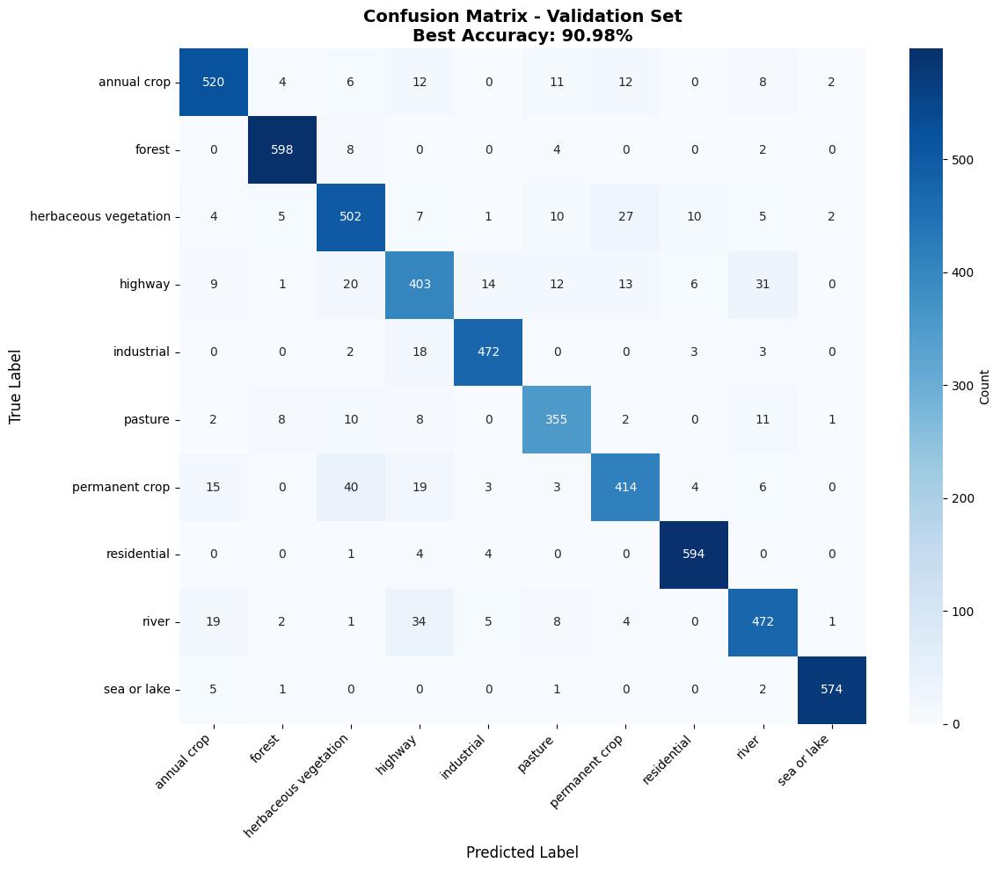


PER-CLASS ACCURACY
annual crop                   :  90.43% ( 520/ 575)
forest                        :  97.71% ( 598/ 612)
herbaceous vegetation         :  87.61% ( 502/ 573)
highway                       :  79.17% ( 403/ 509)
industrial                    :  94.78% ( 472/ 498)
pasture                       :  89.42% ( 355/ 397)
permanent crop                :  82.14% ( 414/ 504)
residential                   :  98.51% ( 594/ 603)
river                         :  86.45% ( 472/ 546)
sea or lake                   :  98.46% ( 574/ 583)
Overall Accuracy: 90.98%


In [48]:
# Generate Confusion Matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Get predictions on validation set
supervised_model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = supervised_model(images)
        _, predicted = outputs.max(1)
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())

# Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=ID_CLASS_NAMES, 
            yticklabels=ID_CLASS_NAMES,
            cbar_kws={'label': 'Count'})
plt.title(f'Confusion Matrix - Validation Set\nBest Accuracy: {best_val_acc:.2f}%', 
          fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Calculate per-class accuracy
class_correct = cm.diagonal()
class_total = cm.sum(axis=1)
class_accuracy = 100.0 * class_correct / class_total

print("\n" + "="*60)
print("PER-CLASS ACCURACY")
print("="*60)
for i, class_name in enumerate(ID_CLASS_NAMES):
    print(f"{class_name:30s}: {class_accuracy[i]:6.2f}% ({class_correct[i]:4d}/{class_total[i]:4d})")
print("="*60)
print(f"Overall Accuracy: {best_val_acc:.2f}%")
print("="*60)